ER vs DH binary classifier
Script overview: 
1. Block 1 of the script imports KS domains from files in "route" and combines with substrate labels generated from file "labels_sheet", then balances the dataset based on the minimal category 
2. Block 2 generates graph networks from carbon alphas using a k-nearest neighbour method. Features are supplied as a OHE of amino acid type. Labels are unified in the graph constructor as graph_y.
3. Block 3 is a dataloader. KS substrate type is balanced in this block for Train, Validation and Test data.
4. Block 4 contains the GNN model, training loop and test step.
5. Block 5  loop that explains each graph in the test data partition.

In [4]:
#### Block 1 ####
### Import pdb files and labels -> prepare for graph creation ###
import os
import torch
import graphein
import pandas as pd
import re

## Import pdb files ##
route = "/home/q31032mw/Dropbox (The University of Manchester)/Max/17_ML_Project/Rank_1/20240911_KS_dimers_extras_aligned_reviewed/"
# List of filenames in the pdb folder "route" #
filenames = os.listdir(route)

# Create a list of absolute file paths in route # 
absolute_file_paths = [os.path.join(route, filename) for filename in filenames]

## Import labels from file and create a dataframe matched to pdb files ##
label_sheet = pd.read_csv("/home/q31032mw/Dropbox (The University of Manchester)/Max/17_ML_Project/Rank_1/20231108_KS_expandedset_reduction_state_labels_new_borders.csv")   # expanded set adds 23 more clusters

# Extract gene names from file names
gene_names = [re.match(r'(.+)\.', os.path.splitext(os.path.basename(path))[0]).group(1) for path in absolute_file_paths]

# Filter labels for the matched gene names
matched_labels = label_sheet[label_sheet.iloc[:, 0].isin(gene_names)].set_index(label_sheet.columns[0])

# Create a list of gene names from the absolute file paths
file_path_gene_names = [re.match(r'(.+)\.', os.path.splitext(os.path.basename(path))[0]).group(1) for path in absolute_file_paths]

# Reorder matched_labels to match the order of absolute_file_paths
reordered_labels = matched_labels.loc[file_path_gene_names]



# Add paths # 
reordered_labels["paths"] = absolute_file_paths


         
NR_total = sum(reordered_labels['NR'])
print("No reduction:", NR_total) 
KR_total = sum(reordered_labels['KR'])
print("KR:", KR_total) 
DH_total = sum(reordered_labels['DH'])
print("DH:", DH_total) 
ER_total = sum(reordered_labels['ER'])
print("ER:", ER_total) 
total_states = NR_total + KR_total + DH_total + ER_total
num_genes = len(reordered_labels)
print("Total reduction states:", total_states)
print("Number of genes:", num_genes)


# Divide labels
categories_list = ['DH','ER']
minimum_category = min( DH_total, ER_total)
sample_size = minimum_category

#sample_size = 157 # You can set this to your desired sample size

padded_categories = []

for category in categories_list:
    category_rows = reordered_labels[reordered_labels[category] == 1]
    print(len(category_rows))
    num_samples = min(sample_size, len(category_rows))
    category_rows = category_rows.sample(n=num_samples)
    if num_samples < sample_size:
        additional_samples = category_rows.sample(n=sample_size - num_samples, replace=True)
        category_rows = pd.concat([category_rows, additional_samples])
    
    padded_categories.append(category_rows)

# Concatenate the original data with the padded categories
balanced_reordered_labels = pd.concat(padded_categories)

# Reset the index to ensure it's unique
balanced_reordered_labels.reset_index(drop=True, inplace=True)

# Print the counts for each category after balancing
for category in categories_list:
    category_count = len(balanced_reordered_labels[balanced_reordered_labels[category] == 1])
    print(f"Balanced {category}: {category_count}")

balanced_reordered_labels2 = balanced_reordered_labels.drop('paths', axis=1)
balanced_reordered_labels2 = balanced_reordered_labels2.drop('NR', axis=1)
balanced_reordered_labels2 = balanced_reordered_labels2.drop('KR', axis=1)

graph_label_map = balanced_reordered_labels2.to_dict(orient='index')

No reduction: 120
KR: 414
DH: 400
ER: 165
Total reduction states: 1099
Number of genes: 1192


[09/12/24 16:14:33] WARNING  To use the Graphein submodule                                         ]8;id=371520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/features/sequence/embeddings.py\embeddings.py]8;;\:]8;id=396913;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/features/sequence/embeddings.py#44\44]8;;\
                             graphein.protein.features.sequence.embeddings, you need to install:                   
                             biovec                                                                                
                             biovec cannot be installed via conda                                                  
                             Alternatively, you can install graphein with the extras:                              
                                                                                                                   
                             pip install graphein[extras]                                                          

[09/12/24 16:14:34] WARNING  To use the Graphein submodule graphein.protein.visualisation, you  ]8;id=305268;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/visualisation.py\visualisation.py]8;;\:]8;id=218240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/visualisation.py#35\35]8;;\
                             need to install: pytorch3d                                                            
                             To do so, use the following command: conda install -c pytorch3d                       
                             pytorch3d                                                                             

Output()

/home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py:160: FutureWarning: The default 
value of regex will change from True to False in a future version.
  df["node_id"] = df["node_id"].str.replace(":$", "")

/home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py:163: FutureWarning: The default 
value of regex will change from True to False in a future version.
  df["node_id"] = df["node_id"].str.replace(":$", "")

                    DEBUG    Deprotonating protein. This removes H atoms from the pdb_df dataframe    ]8;id=853714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py\graphs.py]8;;\:]8;id=560906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py#186\186]8;;\

                    DEBUG    Detected 826 total nodes                                                 ]8;id=211064;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py\graphs.py]8;;\:]8;id=767825;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/graphs.py#438\438]8;;\

                    INFO     Found: 3304 KNN edges                                                 ]8;id=560392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/edges/distance.py\distance.py]8;;\:]8;id=691778;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/protein/edges/distance.py#1130\1130]8;;\

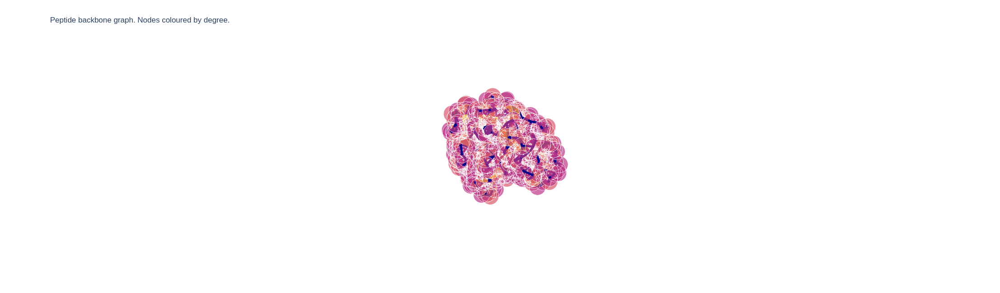

Processing...
  0%|                                                     | 0/3 [00:00<?, ?it/s]

  0%|          | 0/128 [00:00<?, ?it/s]

[09/12/24 16:14:57] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=986176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=909432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=879243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=558851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=391204;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=448035;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=196247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=428960;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=336249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=816725;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=218903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=85116;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=854556;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=818159;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=813565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=781193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=160846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=339743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=733065;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=323322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=903600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=304043;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=540802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=547892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=825495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=455024;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=177185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=595340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=581784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=785061;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=752224;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=277424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=686128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=653855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=156487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=211231;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=763802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=197630;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=717242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=812023;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=512374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=332012;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=403721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=394070;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=565244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=578818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=133456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=409878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=419755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=884470;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=637745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=732600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=700216;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913754;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=396962;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=865669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=842100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=852824;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=484014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=296935;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=79580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=798466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=301974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=179150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=942354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=18803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=565174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=131900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=552072;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=975807;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=349508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=282629;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=58072;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=901761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=689069;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=742953;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=981739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=748575;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=967889;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=300011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=522141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=952729;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=762620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=498909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=937613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=362582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=647481;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=996189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=841542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=40232;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=135656;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=124096;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=592506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=595503;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=527178;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=193256;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=733436;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=43802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=466238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=504376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=446703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=849990;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=984882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=239226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=187783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=652535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=119259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=219539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=913039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=133105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=781796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=292461;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=527294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=143980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=111529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=995763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=147766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=317548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=136103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=72609;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=890522;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=342514;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=112373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=829677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=616506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=121188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=331688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=313790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=67722;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=579995;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=735548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=379942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=821587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=942315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=951057;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=939428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=488156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=301816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=29245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=792780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=449356;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=566120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=986416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=32344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=868881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=949736;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=538478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=882522;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=976828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=314411;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=223458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=476696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=20828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=90081;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=639657;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=558637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=147923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=853746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=936909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=753192;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=414919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=499270;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=382268;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=221075;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=605893;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=510751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258476;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=775837;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=521418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=221596;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=981265;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=467421;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=184379;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=943513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=894965;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=786846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=776420;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=812476;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8986;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=377295;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=849401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=192374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=590188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=903886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=613635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=719745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=452535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=475223;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=754333;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=519574;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=93128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=321315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=393427;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=253705;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=72941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605619;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=718298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=154192;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=90339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=612327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=954703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759957;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=325545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=728594;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=453682;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=897883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=745019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=651229;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=916641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=703303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=292071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=169809;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=439004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=329679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=674499;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=891461;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=794545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=836936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=27321;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=894239;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=951870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=996682;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=181428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=466813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=764190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=598132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=944875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=579605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=339185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=169521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=811551;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=989795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=163261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=821448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=125920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=219862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=199581;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=194719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=500587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=99287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=123571;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=963075;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=479122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=681191;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=422571;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=939181;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=369948;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=549084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=22753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=996925;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=617720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=516370;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=328151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=61120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:14:58] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=175914;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=771498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=562977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=885065;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=28701;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=144805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392205;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=875369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=888136;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=176214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=32170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=481525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=844707;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=359315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=615900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=699604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=665974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=885374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=193605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=972175;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=287335;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=692358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=658522;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=228067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=946759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=471177;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=354389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=379708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=2392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=113190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=588702;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=192534;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=273563;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=531804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=912495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=600079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411549;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=371437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=530744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=547830;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=846003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=683843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=135134;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=944357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=780276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=783914;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=543980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=956012;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=766737;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=805329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=751256;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=912313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=328358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=588602;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=469191;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=992697;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=191805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=27605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=342169;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=422339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798468;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=315988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=255106;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=803929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=790218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=413938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=435852;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=821406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=247278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=885827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=946180;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757252;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=769026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=375396;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=862382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=777246;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=976665;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=894052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=84753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=60233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=186579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=822116;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=865260;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=947454;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=294051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171104;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=828786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=731387;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=290942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=642175;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=505688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=539708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=662794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=249218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=555826;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=922311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=460141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=212900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=650002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=833283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=580905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=442658;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=580943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=479545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=749715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=197636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=417613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=401289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=247579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=789029;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=212670;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=362077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=3401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=410046;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=205172;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=707796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=418264;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=289587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=627716;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=849760;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=96798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=117167;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=874089;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=151189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=787861;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=798707;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=27813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=836946;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=363409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=2733;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=335344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=31302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=251156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=412677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461411;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=179153;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=108919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=137717;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=496261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=570513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=40437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=969929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=762870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=555588;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=694013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=5373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=551060;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=458652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=552549;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=763351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=786982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=479558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=92681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=13474;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=577051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=751104;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=160376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=124132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=189371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=53318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=838534;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=153109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=643511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=87460;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=604473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=462014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=687363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=466892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=692804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=366658;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=957403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=463856;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=25827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=710524;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=884171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=544317;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=332356;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=312105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=637045;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=168267;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=790954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=569803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=361174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=395021;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=699703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=613082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623023;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=573418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=212572;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=60587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=789358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=576713;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=49010;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=314733;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=334179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=987942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=668199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=429501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=872442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=567713;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=107932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=598289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=85638;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=940810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=43162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=503768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=17321;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=944410;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=502051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=580677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=982342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=213919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=130496;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=456894;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=206170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=761731;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=369898;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=336065;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=368493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=771890;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=280186;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=745284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=984376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=443517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=216497;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=249362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=126583;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=916546;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=642610;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=74161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=607743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=229738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=612727;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=126738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=790047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=283975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=274982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=304796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=57487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=730616;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=834484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=326783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=960767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=296725;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=649362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=315783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=191501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=842109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=540242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=303796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=121253;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171102;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=183289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=302319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=153612;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=905999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=411342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=239839;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=304377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=79897;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=435683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=572828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=959259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=769797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=145966;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=752871;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=589368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=219382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=744269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=704706;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=324992;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=492322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=805571;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=638170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=731509;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=152329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=254347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=200083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=301171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=858738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=72294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=762655;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=818373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=607003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=286093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=193355;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=138526;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=67273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=775087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=967611;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=694463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=660153;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=677362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=806442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=899009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=675099;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=792941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=121403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=825373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=943078;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=156450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=756329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=685827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=550690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=737045;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=604967;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=576600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=366924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=447982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=549500;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=793471;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=516856;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=104406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=341633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=409727;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=979031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=900705;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=804870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=584866;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=14227;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=216319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=905553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=598840;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=191609;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=598058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=986659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=285437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=592931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=607236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=162201;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=854644;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=228804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=114951;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=911620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=516133;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=412857;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=962083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=48136;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=859368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=709500;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=55157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=141496;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=117350;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=163132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=62925;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599178;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=655637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=228904;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=163636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:14:59] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=408323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=354467;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=253961;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=750617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=396264;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=218875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=426869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=607724;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=333378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=24207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=850095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=504669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=66181;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=324809;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=80919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=8258;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=680564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=988109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=728882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=833356;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=223358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634124;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=239827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=220157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=462718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=776905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=303439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=812967;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=168276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=322624;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=994207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=989661;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=532343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=63460;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=281122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=954647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=918357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=629151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=256080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=609655;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=929573;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=804003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=786343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=188639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39644;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=378857;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=985174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=962645;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260867;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=413971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=640448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=263135;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=405734;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=41365;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=33412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269023;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=484712;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=788640;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=243685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355914;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=199190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=835635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=366879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=219389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=528938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=376058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=535851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=2240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=16717;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=36238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=381942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=449778;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=986541;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=997021;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=594587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=619179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=22853;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=894150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=980539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=174685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=296138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=871275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=135181;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=237428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=592732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=528613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=632401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=357342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=409313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=789079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=719413;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355227;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=232738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=250581;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=923763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=914295;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=871509;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=784048;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=475951;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=751574;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=157988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=740372;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=529633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=977012;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=881775;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=431892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=582810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=428521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=272101;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=381480;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=128092;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=593175;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=409221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=4762;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=635247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=41412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=699805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=774445;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=276795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=348448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=220881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=572112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=982867;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=731638;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=552416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=389148;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=876187;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=178835;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=648660;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=654466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=973901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295479;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=59068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545577;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=885358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=418046;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=312579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=137257;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=49014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=783602;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=193116;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=715366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=676205;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=343980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=917126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=775362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=798496;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=400126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=910352;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=681890;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=17324;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=180457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=59790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=566797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=618480;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=32524;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=660967;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=741804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=404184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=750987;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=807268;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=26489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=281283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=156689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=522620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=818126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=900536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=695580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=199740;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=288627;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=167262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=947869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634950;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=698813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=999839;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=714349;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=879115;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=129047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=839858;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=270389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=666343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=383021;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=460869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=675602;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=961235;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=969416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=796318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=672521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=799386;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=748803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=355554;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=523082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392638;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=681517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=865977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=210152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=342129;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=10586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=697239;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=7894;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=828992;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=439174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=32442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=993390;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=624144;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260950;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=896006;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=84567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=586439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=486475;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=675511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=620710;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=530456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=726585;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280301;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=429998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=536097;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=376127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=193026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=934896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=631806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797465;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=567243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=841103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=8378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=190870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=515014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=228711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=163901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=642190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=297261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=910334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=827853;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=622346;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=900173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=271948;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=577926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=592414;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=695109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906615;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=558080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=377886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=127296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=922114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=249978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170877;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=560115;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=81671;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=884238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=851418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=295303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=671228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=330446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=275585;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=336634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=383878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=307283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=725808;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=163167;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=890109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=36532;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=43265;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=849627;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=725108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=449697;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=310520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=421283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=366127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=736219;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=397066;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=59803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=484210;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=675233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=43555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=338401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=663878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=693750;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659125;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=970318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=192520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=620044;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=419903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=8403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=802944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=723959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=416700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=636418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=525165;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=113311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=538892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=204368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=644373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=338990;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=215034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=79371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=841905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=882767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=353504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=181457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91704;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=181637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=302043;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=679088;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=622593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=296318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=581151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=683112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=45529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=750043;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=551591;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=702724;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=503899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=542504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=12704;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=262311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=435387;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=762845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=793973;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=802868;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=383409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=128746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=10352;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=976388;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=409326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=722065;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=735446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=543557;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=19490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=505509;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=702147;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=633960;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=852036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=329800;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=228694;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=530324;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=1952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=768983;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=361601;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=491622;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=940176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=911398;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=458136;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=632414;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=875735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=245795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=964667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=186388;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=805504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=261079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=873629;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=419617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=16848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=866913;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=229518;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=216631;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=65294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=412437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=695940;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=186344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=557493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=316206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=755466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=702523;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=743750;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=870000;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=207768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=4438;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=528945;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=767433;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=788024;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=702937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=658407;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=576339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=276286;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=381631;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746255;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=222152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=462170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=295930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=715304;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=642797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=441544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=953828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=106364;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=663955;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=760568;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=130805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=866832;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=771833;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=901306;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=650164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=281473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=958589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=882786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=34068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=214539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=869083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=130079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=518688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=129544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=761287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746010;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=376053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=66266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=867827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=729296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=894691;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=509608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=317327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=428798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=406386;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=110119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=691164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=719236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=215806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=227631;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=786582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=380404;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=896386;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=189015;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=931633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=251375;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=596632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:00] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=824590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=791071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=974255;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132419;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=900086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=650020;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=594700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=670315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=656428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=898262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=752584;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=961827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=32009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=329723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906167;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=383519;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=162969;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=981803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=813424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=137013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=601277;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269444;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=33876;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=820018;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=95380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=733451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=825925;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392674;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=137879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=416300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=323835;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=608021;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=378256;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=647924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=350303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=491484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=143675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=374869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=117969;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=13968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=249530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=755259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=914531;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=887425;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=629737;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=843850;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=416045;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=455495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=692038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=604094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=105034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=271743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=716180;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=314086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=501895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=176271;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=463263;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=717200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=165816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=921069;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=955865;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=183965;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=176309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=453952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=743284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=35786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=263319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=436494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=149245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=665169;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=122073;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=391719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=682495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=11683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=668163;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=863245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=683892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=418142;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=517463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=467127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=655695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=644632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=878394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=621613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=418442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=741276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=157239;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=311604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=737961;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=602912;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=454279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=805471;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=611612;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623949;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=953205;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=921517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=473082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=805448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=682941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=169793;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=633794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=978152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=393175;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=943726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=809309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=685458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=179187;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86787;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=552720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=67560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=195717;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=750144;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=809161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=619058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=440983;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=585931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=235160;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=285378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=877934;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=410994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=384694;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=984465;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758671;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=93265;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=251711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=841815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=783196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=824374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=437812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=47393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=44581;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193687;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=796019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115758;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=684935;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=87184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=646775;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=511680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=296085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=142891;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=156625;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=101193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=580823;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=957870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=544698;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=225881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=778167;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=780589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=838126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=840911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=690661;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=637766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=400806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=841714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=768207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=331977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=496903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=718746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=134821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=650586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=32314;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=876801;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=819544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=644411;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=13477;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=917186;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=540251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=376113;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=637455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=728273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=962109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=409224;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=756933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=967337;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=332352;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=14593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=494491;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=531826;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=3561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=331815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=808857;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=788473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=475148;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=919401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=873572;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=408818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=710979;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=87470;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=373464;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390353;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=154230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=909478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=57954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=387528;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599584;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=646777;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=280747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=417502;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=140430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=198042;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=525875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=897461;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=343888;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=207519;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=251432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=874087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=416793;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=442650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=92529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=514515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=57999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=285761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=960956;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=375146;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=158933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=929439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=783428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=980365;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=106023;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=494983;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=59385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=841093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=280542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=457646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=60276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=611642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=108997;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=4417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=940710;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=487074;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=128584;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=683465;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=213318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=285170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=320189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=465323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=351751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=550329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=603989;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=881753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=80037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=947640;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=395908;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=26093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=308468;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=668573;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=987837;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=981437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=949711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=840107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=994936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=192020;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=153938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=146380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=520025;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=25527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=12402;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=956100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=836841;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8850;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=632367;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=449649;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=272540;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=546238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=574016;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=952683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=199945;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=590532;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=980800;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=143531;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=637017;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=144883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=960749;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=912793;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103661;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=308642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659267;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=17278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=337024;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=682237;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=851128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=822318;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=694078;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=499132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=636928;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=166143;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=108317;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=649770;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=626770;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=464669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=660363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=9677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=803734;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=288315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=719179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=971345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=747271;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=490443;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=679396;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=318664;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=803074;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115829;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=269134;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=550218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=436758;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=842758;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=271662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=782889;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=269598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=636608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=495552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=765989;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=956311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=459505;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=164139;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=200362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=592339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=965141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=884347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=130822;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=956275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=699035;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=55724;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=698238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=604926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=955966;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=960598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=501137;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=486663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=559603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=674994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=390548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=78468;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=108695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=394129;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=939259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=189229;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=110938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=184564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=842317;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=811726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=860157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=618221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=884513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=858616;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=831916;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=991955;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=926422;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170124;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=305462;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=260860;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=664499;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86868;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=806765;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=95049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=159562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=994273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=676392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=201508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=104226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=797747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=743329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=792008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=368291;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=333430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=172056;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=875185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=551399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258691;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=308372;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=844920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=124917;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=277001;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=33552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=463751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=224862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=653103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=904546;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=456391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=703757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=146797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=713595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=217114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=86110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=937330;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=184119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=502610;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=262070;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=848085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=828459;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=528036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=458725;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=142874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=411878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=182748;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=626843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=6389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=627106;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=284742;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=706206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=133352;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=934881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=892101;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=525967;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=831567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=253826;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=832207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=400225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=142077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599756;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=776327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=813025;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=887389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=603812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=986926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=332611;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=123149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=81296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=556374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=767872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=384577;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=984269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=600899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=526781;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=83560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=232958;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=74313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=347232;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=408117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=5796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=607291;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=789719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=938214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=364590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=618535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=578287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=535078;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=538440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=732771;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=36243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:01] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=589112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=877057;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=636339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=332120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=555590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=564922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=356132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=430912;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=647744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=21962;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777722;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=604885;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=84111;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=371154;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=250109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=680476;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=22805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=66788;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=152005;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=571392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=911134;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=241071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=824907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=49658;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=484777;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=244511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857707;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=978613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=813766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=33422;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=981469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=140935;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=405231;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=252336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=818663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=511959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=123409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=289388;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=548701;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=922217;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=114921;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=863319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=231219;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=909728;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115863;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=762835;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=626128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=700737;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=531915;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=765780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=761572;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=414436;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=644127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=45323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=799299;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=345778;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=978911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=893382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=459824;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=678604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=232570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=508257;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=858690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=539523;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870000;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=374855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=544817;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=952030;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=861443;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=445819;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=509811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=60804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=542629;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=459538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=478181;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=692085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=786739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=810946;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=655561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=792203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=316595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=485380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=209199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=18924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=314255;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=655443;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=313899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=698445;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=989679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=227262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=526797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=70690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=974555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=451082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=211149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=649942;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=66013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=761821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=227605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=54562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=619420;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=928814;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=495149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=503847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=375558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=321652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=263130;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=345743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=268945;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=163538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=234342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=504260;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=671521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=592353;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=986409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=217280;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=34876;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=574538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=691277;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=96767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=345188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=607112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=755522;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=974632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=796336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238645;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=760368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=286806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=190886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=298430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=867416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=322121;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=225038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=811233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=683944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=934668;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=442859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=390636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=915055;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260134;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=600515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=38592;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=902495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=737850;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=184400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=515600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=182070;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=782317;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=157448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=822354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=251503;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=750965;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=388445;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=663430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=321866;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=473991;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=488232;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=838059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=958028;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=651904;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=668693;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454915;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=931234;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=263397;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=307370;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=379003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=436859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=247372;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=619019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=592455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=495508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=436286;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=488525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=669596;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=687920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=17643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=715359;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=942536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=427011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=783589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=178302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=463380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=89520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=328031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=453136;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=256979;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=775555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=84061;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=142440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=970457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=156874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=742131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=742519;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=290164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=654527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=935723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=272248;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=785408;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=99614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380201;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=78094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=952246;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=536208;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=865541;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=884068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=120387;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=668210;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=568233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=425639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=466908;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=908184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=932444;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=588883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=975103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=472050;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=53353;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=495692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=340738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=470060;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=858096;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=767475;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=114804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=812965;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=742911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=640816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=671818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=24867;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=667976;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=616766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=795819;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=810034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=795105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=611690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=774570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30000;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=487360;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=647456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870950;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=211711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=1567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=121953;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=241003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=434888;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=851617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=370008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=161990;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=522730;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=666050;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=702669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=602502;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=152358;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=219449;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=208771;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=244583;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=953494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=645034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=439886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=802508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=313715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=742185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=779561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=699323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=5027;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=499338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=610902;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=628066;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=978170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=211545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=76376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=551287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=164595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=51176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=803619;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=712928;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=246379;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=353202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=572038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=679340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=278869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=789787;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=315720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=611395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=881944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=40649;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=452527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=915271;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=670717;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=981556;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353483;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=922686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=27755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=254225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=639284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=844910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=684941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=705679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=480232;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=397994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=698100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=466463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=764512;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=255743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=74515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=896139;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=198516;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=562709;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=774157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=131007;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=53382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=680880;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=621604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=513874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=965570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=515300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=566296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=819646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=542197;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=53969;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=595739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=341228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=803285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=351019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=963564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=909836;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=880919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=123932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=635552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=875345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=741394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=162535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=58946;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=271746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=536483;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=181013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=769492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=530006;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=444282;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=972302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=496423;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=781639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=234685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=49780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=987283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=250975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=810432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=925917;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=702384;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=199849;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=93391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=699097;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=277481;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=762466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=754564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=999987;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=518633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=728086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=651582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=301441;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=217603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=656395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=52790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=521323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=201228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=32155;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=354184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=178521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=859995;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=321787;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=713399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=35497;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=776403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=456182;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=840026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545217;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=830415;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=487839;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=479910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=135320;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=304087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=872674;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=239715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=171513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=82202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=426119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=542051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=414287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=189622;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=405632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=154686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=89168;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=830685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=351008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260691;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=997926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=994627;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=598131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=116357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=443330;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=208559;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=36052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=395139;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=965407;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=397409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=920594;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=663879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=110637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=872174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=815474;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=11916;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=661395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=909776;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=193664;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=665279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=46971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=697369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=260492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=82972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=686032;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=623126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=766991;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=530067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=9824;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=3797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=872050;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=432773;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61835;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=349071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=305289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=467899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=458747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=871093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=335789;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=416496;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=512477;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=763205;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258664;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=580324;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=132830;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=765735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=2643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=194765;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=57483;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=494574;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=717996;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=130851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=422877;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=240919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=509012;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=403273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=570013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=144236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=265224;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=639192;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

 33%|███████████████                              | 1/3 [00:27<00:54, 27.30s/it]

  0%|          | 0/128 [00:00<?, ?it/s]

[09/12/24 16:15:33] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=846797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=747340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=982551;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=898279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=831640;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=979471;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=438801;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=305981;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=975620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=452791;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=947501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=492107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=232344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=238252;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=898140;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=747866;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=922289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=163585;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=80883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=792667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=432663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=754647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=629640;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=354558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=725404;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=809486;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=164272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=242259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=409048;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=800160;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=742227;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=408280;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=312732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=233172;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=403659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=743828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=539335;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=649544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=289854;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=736279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=525245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=938870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=641805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707364;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=485834;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=9647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=411265;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=381292;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=798646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=700634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=687926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=500377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=854545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=562810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=642431;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=502131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=971816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=859220;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=435060;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=183467;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=786530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=148057;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777172;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=913035;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=9896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=998517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=304366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=581806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=969687;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=168219;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=591108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=848891;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=671959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=139855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=496047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=137696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=955818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=277847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=582706;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=767852;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=936623;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=938498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=55686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=917342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=971274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=543459;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=874081;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=609822;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=207165;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=876174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=184052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=368304;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=704687;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=919453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=667038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=180237;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=950313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=232305;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=149878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606020;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=767482;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=36060;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=523804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=342040;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=693103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=127553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=577646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=807614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=562151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=10374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=470605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=991996;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=416723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=680735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=452997;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=743475;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=541216;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=436712;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=890462;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=215812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=269812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=616339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=113486;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=233676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=453558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=146393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=985867;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:34] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=596112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=130693;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=27698;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=469309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=559392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=20929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=304018;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=830756;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=589155;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=368085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=713165;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=859584;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=751310;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=913520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=422173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=489796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=845840;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=41988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=918969;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=337518;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=705233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=341033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=673580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=405695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=603649;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=721700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=600923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283507;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=149611;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=847437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=765922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=542903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=386370;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=364892;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=829124;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=117909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=644739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418419;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=509811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=971456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=174905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=937913;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=94234;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=957332;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=565036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=247336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=571556;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=650896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=14311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=718503;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=366555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=294582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=960663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=277602;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=552453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=632342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=960450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=308938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=559679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=278039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=288030;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=922172;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=994107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=292885;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=575071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=398947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=649188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=188699;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=858884;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=948049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=335921;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=414444;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=768709;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=718362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=321721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=970632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=158713;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=71897;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=669053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=665368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=734351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=842179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=875708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=319680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=983875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=279227;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=6553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=455724;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=906281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=955190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=947196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=981397;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=29593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=729921;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=36786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=907086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=632210;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=656764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=784759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=816137;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=342212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=568022;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=684098;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=925565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=253794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=489652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=183907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=38568;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=331821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=761259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=792035;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=535417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=980762;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=332719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=607019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=788872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=672278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=356763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=77359;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=99301;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=428097;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=148347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=224311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=565958;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=790040;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=607569;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=363982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=799196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886852;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=119838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=232982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=375864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=276800;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=562971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=140117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=102547;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=293240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=748087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=763798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=880248;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=520889;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=826597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=944771;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=85251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=381972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=621492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=2808;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392516;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=174705;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=712738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=352872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=961523;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=44268;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=849194;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=908059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=669612;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=374724;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=417856;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=686787;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=56230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=481879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418918;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=615297;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=917947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=347539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=174885;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=151171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=412267;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=600849;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=458326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=764521;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=965367;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=290943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=554116;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=11769;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=903047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=115478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=829325;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=282827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=333159;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=637248;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=117735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=888775;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=684772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=805062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=86467;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=218288;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=694019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=718539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=20744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=506193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=269471;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=125080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=485847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=95229;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=680296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645148;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=844322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=882247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=981858;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=164757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=489473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=659170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=663273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=216042;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=497261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=60074;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=801473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=915259;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=369409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=99970;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=547302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=640442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=590896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=720360;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=575748;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=459328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=787763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=861338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=184363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=226242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=553393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=455626;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=181909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=231316;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=419477;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=370296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=699524;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508372;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=303196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=280294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=182469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=90250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=68725;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=974453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=683114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=348016;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=751685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=581117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=31791;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=839255;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=183941;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=420520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=812169;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=707919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=115218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=133142;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=114842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860030;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=645221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=726135;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=506899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667510;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=974276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=203328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=404322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=202974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=263423;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=521151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=732062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=537780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=475486;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=216780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=868377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=929309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=233734;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=535781;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=50804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=400177;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=266005;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=854298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=2118;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=583454;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=369743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=19072;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=390126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=16853;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=809158;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=844416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=518417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=133261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=664790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=441597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=852843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=851225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=254249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=687490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=794721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=875729;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=54009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=245642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=618564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=322391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=318808;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=449432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=619686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=7512;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=669497;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=855251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=262859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=346562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=319347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=101148;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=603406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=861006;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=364567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=120530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=326166;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=602816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=921241;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=96598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=46464;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=192496;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=312252;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=700506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=294618;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=598428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=680439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=313049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=326170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=146342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=116674;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=282607;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=258254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380569;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=849267;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=354879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=323144;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=137664;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=329117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=791683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=53128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=372412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=696463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=121334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=735596;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=550772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=445860;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=68785;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=863811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=773442;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=77659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=994291;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=682668;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=278955;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=740954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707348;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=289325;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=830848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=814039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=502104;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=814937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=63905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=714418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=131733;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=363309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=12517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=190095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=731250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=496346;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=122650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=534970;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=324309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283502;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=598348;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=543295;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=970745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=465446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=166887;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=43535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=59718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=374704;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=322292;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=244351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=25944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=112847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=933686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=149376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=90446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=228709;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=973684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=993164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=437236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=607294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=473558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=867193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=680924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=748384;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=603539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=400592;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171956;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=246082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=554978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=823577;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=650239;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=939280;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=150762;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=149680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=873197;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=79759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=46403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=988470;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=93227;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=871874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=274097;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=615641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=165910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=557739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=360215;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=347598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=899779;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508381;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=898970;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=24764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=192901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=359;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=188650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=300649;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=602159;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=658685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=214672;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=151786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=461171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=151498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=478275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=616345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=503052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=574121;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=520665;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=227810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=743722;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=1162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=930512;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=20189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=817189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=687250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=496103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=491911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=262555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=397298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=124915;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=223958;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=220344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=352298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=571222;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=423158;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=815413;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857361;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=756974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=829328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=702932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=180274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=172082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=889872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=932864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=616922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=522354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=671973;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=375334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=388748;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=924795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=705251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=565347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:35] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=404778;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=643986;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=787008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=47802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=45771;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=427054;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=901678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=131378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=343413;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=330322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=799726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=21877;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=591455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295349;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=124136;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=97564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=876884;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=635665;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=804537;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=16427;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=608931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=123668;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=627741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=333984;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=994157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=609593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=45225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=408301;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=510135;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599575;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=636744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=397172;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154331;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870210;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=980884;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=191860;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=428771;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=575803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=708632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=809608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154984;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=368165;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=713648;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=53173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=93675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=721625;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=314063;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=916082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=149118;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=937385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=846944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=871508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=509903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=134994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=300982;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=784423;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=882200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=68597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=357047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=990039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=925908;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=40975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=184586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=933336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=462484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=635490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=672644;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610307;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=652119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=947973;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=453111;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=577151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=906037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=468067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=84677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=178790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=635825;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=964933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=923948;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=316300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=122326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=416391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=512777;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=68858;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273237;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=348230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=928857;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=335614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=922383;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=945900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=527258;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=339173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=43093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=872800;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=215403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=746729;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=761196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=847922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=721077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=980844;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=509343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=483089;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=458591;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=962489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=736095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=7689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132471;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=740945;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=515794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=383708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=519439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=233501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=407765;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=161611;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=365508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=715127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155180;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=466881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=636651;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=713066;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=476417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=696207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=549173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=147795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=583319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=311507;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=382585;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=800228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=310378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=520422;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=617634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=668501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=681971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222970;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=410730;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=420001;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=354629;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=673342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=557639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=849506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862364;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=104987;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=618388;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=286159;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=739882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=420871;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=500563;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=222306;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507832;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=589907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=890377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=902783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=621744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=596791;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=490203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=30307;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=284323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=648457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=605718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=667911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=318177;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=55369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=646566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=233501;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=805910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=654882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857665;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=898487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=383430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605286;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=725256;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=752101;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=227784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=162711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=9432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=907401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=36737;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=991147;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=18543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=586173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=615754;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=563014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=429959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=316996;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=248185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=961439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=438960;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=441908;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=88920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=856385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=234054;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=460138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=401984;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=549451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=530633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=581641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=333511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=142827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=794839;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=481848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=29079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=622799;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=977598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=561701;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=923115;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498459;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=657876;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=794538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=875281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=552508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=394328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=569903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=887162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=214645;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=297451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=326979;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=596157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=521917;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=248526;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=935201;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=700321;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=595655;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=455033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=5757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=304474;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=760217;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=214462;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=671931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=808062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39849;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=328210;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=705402;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=867493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=721011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=192170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=484576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=138004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777305;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=77656;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=909164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=446385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=306974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=26452;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=841333;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=356126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=1641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=949726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=677322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=736723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=153139;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498063;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=394773;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=614570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=499288;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=398682;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=392327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=920221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=672091;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=331673;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=932351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=119472;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=160038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=693755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334098;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=184579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=744174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=931678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=632432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=846033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=475011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=821924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=391794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=320169;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=537109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623425;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=66270;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=255911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=273289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=168883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=86926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=891069;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=267362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=717117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=17751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=114055;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=771193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=997376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=842753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=977242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=487323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=615957;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=587186;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=148441;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=323299;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=312613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599549;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=145877;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=560553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=118253;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=372720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=756675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860431;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187609;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=692630;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=116206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=672084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=46114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=990491;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=568522;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=484699;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=358273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=683916;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=934462;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=973530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=674654;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=519009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=624018;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=845920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=681036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=113515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=277655;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=599899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=274846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=545890;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=407133;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=850864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=735002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107800;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=534269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=696899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=433269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=88019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=562661;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=966600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=590753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=197371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=780838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=73933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=573053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=30705;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=334742;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=488948;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=246687;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=915666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=540820;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=713183;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=469802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=925343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=245528;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=609943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=137394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=551818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=93732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=677955;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=845834;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=835980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=810813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=468400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=560487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=956505;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=365659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=285272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=484460;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=370489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=90805;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=304561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=203140;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=647940;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=931962;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=939749;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=284369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=696398;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=509048;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=290323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=476540;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=950630;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=425162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=228428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=549721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=571538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=290654;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=955077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=983869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=640819;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=771100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=913863;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=102697;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=681662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=800242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=119572;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=575382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=98507;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=814456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=309728;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=173233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=559416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=974087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=439706;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=942366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=136711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=753562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=322214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=96045;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=873379;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=655972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=56490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=135169;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=818480;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=669425;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411420;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=143888;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=628099;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=363272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=419568;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=550019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=771257;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=680053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=302131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=764101;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=464450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=807315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=256903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=186017;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=564455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=127812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=993543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=993392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=327015;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=632102;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=670286;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=864416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=29308;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=190569;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=201530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=4840;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=809138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=652789;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=382103;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=649951;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=125366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=510207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=691659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=630400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:36] WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=253586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=366126;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=762033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=560530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=581440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=396419;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=782452;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=736289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=204643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=188878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=617056;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=861250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=96837;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=264646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319118;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=964244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=442777;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942618;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=753742;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=108334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=911786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=521608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=544053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=660057;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=855809;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=910512;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=365788;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472981;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=674002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=834790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=567838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=479303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=690797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=21759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=861719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=861773;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=877949;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=140581;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=479205;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=874327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=738681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=788417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=614399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=879862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=224343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=387934;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=417532;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=844545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=242034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=681767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=349689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=119422;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=208847;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=907695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=873641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=235233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=208591;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=698272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=954934;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=371909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=575325;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=905044;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=58636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=97741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=1741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=538195;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=491927;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=17804;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=896333;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=444038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=90550;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=371603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=7684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=431492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=128873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413563;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=712582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=673718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=883041;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=600998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=56807;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=506843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=714218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=892531;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=692565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=714481;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=305723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=249607;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=569868;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=359818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=558641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=383931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=642917;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353187;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=848244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=146277;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=627178;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=715840;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=5289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=49311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=266289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=96327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=836003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=920466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=745905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=2082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=463785;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=48399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=815879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=522760;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=587464;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=375100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=610857;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=952112;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=843047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=392708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=845601;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=596149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=257067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634076;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=49173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=443822;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=272583;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=139085;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=867924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=35614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=970615;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=829245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=112147;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=999721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=501400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=359590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=681580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=919214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=135620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=183308;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=103608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=217796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=398978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=387444;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=446240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=387263;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=954042;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=496968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=119736;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334420;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=402168;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=550993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=989149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=274289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=336242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=108474;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=853082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=92341;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=511639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=695801;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=991076;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=565249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=364284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=60461;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=525832;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=134508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=245327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=723772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=364326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=867398;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=47570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=189860;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86887;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=334894;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886027;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=218436;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=389570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=27580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=920916;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=926665;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319987;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=655783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=9870;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=423710;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=952323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=5588;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=973238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=734414;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=409294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=689469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=598000;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=955435;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=530985;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=649806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=217672;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=292658;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=3428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=509278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=109891;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=976542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=612589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=994162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=64274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=65430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=486386;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=139854;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=629900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=557443;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=604743;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=907412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=34436;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=209510;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=965551;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=488532;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=832874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=915570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=659930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=5882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=75760;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=967073;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=948717;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=147231;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=971543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=441980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=259173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=765768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=792176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380356;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860782;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=502702;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=317899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=240654;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=26590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=291860;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=936009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=896236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=507073;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=827641;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=693930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=421313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=697393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=937671;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=964262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=181368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=942964;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=427233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=577352;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=535699;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=528599;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=370988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=120848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=935514;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=997672;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=490923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=978972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=493767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353267;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=778316;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=817396;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=282590;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=831852;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=433371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=866949;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=235793;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=907538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=700067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=538080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=35636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=460552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=728659;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=581515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=281319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=420357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=832692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=856975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=601495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=220403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=9690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=218543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=53038;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=873701;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=843817;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=813547;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=752025;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=365345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=98624;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=827231;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=627240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=102903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=14685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=969726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=240322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870213;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=662290;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=542798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=478504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=202270;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=338541;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236799;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=235004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=537910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=332738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=235595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=892886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=655593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=490290;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=882040;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=516193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=170274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=228859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=537367;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=893203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=34498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610005;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=350814;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=615348;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=300328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=412014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=573049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=112662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=959375;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=213875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=884618;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=668550;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=902566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=732656;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=810343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=76586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=313029;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=735580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=929954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=262556;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=877577;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=294223;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=537880;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317054;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=441931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=59622;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=860930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=596241;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=699790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634481;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=605566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=850603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222880;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=126576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=791179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=40688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380963;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=88366;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=741744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=4099;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=799400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=56031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=476714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=78931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=545118;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=663661;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=524403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=764247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=542679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=753311;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=91155;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=716655;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=98759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=922663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=894936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=799011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=957735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=475851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=487058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=471300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=205566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=735009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=105188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=822622;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=62639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=639820;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=971482;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=255757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=515908;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=86084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=64385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=270423;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=6494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=851500;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=773304;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=557470;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=179974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=548395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=280906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=723525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=421712;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=65138;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=893280;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=248094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=869292;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=415608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=546953;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=774183;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=297872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=350666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=937627;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=914384;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=519527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=133639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=729836;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=877245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=988319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=723162;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=970272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=79479;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=809628;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=94515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=467538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=617445;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=210931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=641463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=512580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=729632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=189647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=48143;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=594864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=365825;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=703548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=793450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=339298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=472567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=427635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=198003;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=174902;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=245342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=789755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482711;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=850426;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=914799;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=260874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=620430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=633563;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=31451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=267580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482231;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=109513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=608525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=423288;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418333;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=205447;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=373243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=133223;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=604504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=191788;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=214729;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=457251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=728539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=106756;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=544225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=330895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=996848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:37] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=535542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=954780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=238777;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=698893;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=744671;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=6767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390426;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=309872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=225549;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=350278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=482880;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269673;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=361853;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=369520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=891547;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=554821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=733526;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=975206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=906597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=147176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=269864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=567351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=987051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=986746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=183185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=14850;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=624583;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=227062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=346952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=145891;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=650978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=964193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=40907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=640678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=525681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=652387;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=996657;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=237257;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=673348;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=340843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=285752;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=941378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=587017;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=451108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=243099;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=516736;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=918513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=918156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=931425;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=555137;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=757018;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=356875;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=717473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=272339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=403416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=377071;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=63778;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=285392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=698842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=99310;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=623262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=306855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=441437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=762620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=915571;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=989226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=187703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=355412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=162204;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=782334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=552723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=555758;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=706625;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=987431;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=97048;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=275125;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=451772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8903;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=459432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=298902;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=919947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=282186;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=637669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913577;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=47862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=157692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380421;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=5418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=105437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=33128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=906020;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=906385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=23040;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=213862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=932767;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=160985;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=457061;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=658063;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=741669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=637511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=643561;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=909693;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=183184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=458336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=421359;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=223579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=182052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=282839;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=896494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=303309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=290950;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=679338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=973557;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=617458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=362015;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=455555;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=128879;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=711430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=466780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=585939;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=491494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=213183;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=845882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=324620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=931963;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=16928;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=940327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=121130;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=457614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=12344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=952094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=15746;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=932866;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=296812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=297906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=202597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=644017;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=396201;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=69221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257408;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=659011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=815764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=477802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=374230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=885909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=634638;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=970254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=867996;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=258394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=35925;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=754915;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=509613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=789517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=539439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=470695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=609122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=764809;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=620512;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=980278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=602280;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=451200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=427845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=135605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=73314;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=335823;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=448416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=668342;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=932765;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=90669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=945974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=545669;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=802776;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=187049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=794819;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=321483;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=547605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=66968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=18067;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=585953;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=58165;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=861131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=643015;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=83753;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=477384;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=768834;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=202731;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=686438;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=408573;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=714814;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=827876;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=290467;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=810692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=31912;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=742110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=144985;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=257675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=558131;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=745831;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=345266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=790798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=712667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=794198;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=56273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=420059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=909374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=23979;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=239666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=982117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=486226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132626;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=191506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=869589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=895816;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=652593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=439298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=710815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=334890;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=316141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=115929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=930437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=41503;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=359530;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=571202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=604068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=220825;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=92203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=890975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=820635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61388;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=532900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=86002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=544256;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=332790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=861569;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=48440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=81490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=849516;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=568025;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=469216;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=858534;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=915147;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=69121;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=816434;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=485033;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=236560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=808317;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=230281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=235400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257346;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=663174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=291700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=19639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=912458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=350434;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=6923;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=635642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=365677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91623;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=703819;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=581732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=695392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=831544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=741633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=741362;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=887785;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=587678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=407058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=850094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=389811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=781770;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=242095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=540048;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=489009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=984104;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=946905;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=298145;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=811402;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=815803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=660425;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=830208;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=186391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=551882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=633447;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=851968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=701735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=232647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=900251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=735599;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=654389;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=376223;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=300696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=643764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:38] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=834324;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=872419;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=396380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=268855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=911062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=633218;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=943829;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=837462;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=570570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=217595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=635246;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=396263;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=750592;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=544586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=802234;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=143487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=415313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=177869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=24754;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=698141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=591291;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=933343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=555498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=828664;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=318972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=138633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=783334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=747075;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=382741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623782;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=601199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=604035;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=67302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=40621;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=446488;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=560273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=424757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=893936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=431670;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=939627;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=565745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=273732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=778303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=975508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=779276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=598906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=628971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=215207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=741764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=690972;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=538976;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=27331;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=805584;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=659226;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=283455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=661338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=995127;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=897574;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=305769;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=660157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=488409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=999298;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=738206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=630680;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=711606;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=742196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=468163;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=763323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=944666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=689244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=473152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=247618;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=962323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=920947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=200845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=543114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=800965;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279341;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=566662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=235675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=892151;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=89430;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=234788;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=233100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8098;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=188515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=202924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=160446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=822454;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=952160;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=129108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482264;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=663064;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=879812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=299784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=166966;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=302336;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=907194;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=169730;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=100662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=140741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=349176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=961774;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=47980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=235607;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=579326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=794331;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=679108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=941810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=815384;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=876089;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=533845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=531;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=315014;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=615689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=569597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=808019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=357444;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=983920;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=833451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=489572;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=343289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=795345;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=392330;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=689387;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=306182;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=129340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=959233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=4752;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=447306;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=423648;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=503958;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=246434;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=716681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=421242;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=181863;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=859090;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=141769;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=436450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=780506;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=641303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=679692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=117196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=286076;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=807587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=666145;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=320190;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=143504;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=636102;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=763638;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=518582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=502815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=689495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

 67%|██████████████████████████████               | 2/3 [01:03<00:32, 32.63s/it]

  0%|          | 0/74 [00:00<?, ?it/s]

[09/12/24 16:15:55] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=186931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=438203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=340599;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=373022;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=73873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=329453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=149500;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=217450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=712466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=565881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=553244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=941693;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=214047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=993297;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=785026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=210677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=547351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508108;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=292304;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=417610;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=719513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=714436;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=994650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=706715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=479563;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=201453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=213549;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=514001;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=757037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746413;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=791598;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=778440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=210505;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=209196;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=929667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=480895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=754682;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=269344;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=256831;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=356339;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=43299;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=932219;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413468;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=449312;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=932528;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=849554;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=453529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=60042;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=124382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=516745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=14837;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=919049;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273812;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=243500;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=672228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=648289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=423891;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=88833;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=633277;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=597929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=690405;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=521651;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=481699;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=80128;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=226553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=857394;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411477;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=43728;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=594008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=572830;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=107257;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=8901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=648546;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=98050;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=889616;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=254228;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=168703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=403005;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=114813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=273700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=189199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=4245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=293254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=375831;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=931207;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=596930;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=854620;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=626529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=618784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=42044;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=571427;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=519084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=696354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472087;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=72486;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=83382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=578438;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=748212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=422111;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=217848;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=283368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=65624;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=579016;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=220275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=547637;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=799915;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=154794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=177149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=30068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=67956;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=314186;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=108166;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=927675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=503720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=182467;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=13996;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=696379;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=120330;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91357;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=313975;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=939688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=816457;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=305893;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=139838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=724086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=977421;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=51385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=470685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=335714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=628998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=462873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=970662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=5337;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=100249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=429450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=153283;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=264703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=232451;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=437723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=120077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=30582;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=605082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=18113;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=822123;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=332421;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=250039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=576763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405229;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=693808;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=827751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=7408;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=174952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279429;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=653225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=855645;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=918684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599135;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=89107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=99075;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=710678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=49864;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=513450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=66794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=281285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=974120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=180998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=84703;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=195662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=292735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=321684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482415;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=957599;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=959164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=264401;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=288571;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=784273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=205587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=332529;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=207544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=760458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=179392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=334653;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=307372;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=850534;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870482;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=879586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=465541;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295527;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=64220;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=886377;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=130037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=850516;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=306631;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845865;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=887618;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=199742;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=348473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=383882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=784323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=813576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=33009;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=410560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=854799;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=642613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=40349;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=914095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=861686;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=904155;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=774322;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=845023;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=948756;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=810701;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=510240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=232580;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=21433;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=347461;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=360346;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=904290;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=47559;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=24039;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=316132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=968652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=353490;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=544020;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=630910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=749850;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=656888;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=237970;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=581240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=103648;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=514120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=530873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=599632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=156363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=764094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=162181;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=449681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=806900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=867579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=249081;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=607077;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=84438;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=467807;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=560938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=860690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=3463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=784266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=574987;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=891435;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=334046;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=398633;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=69675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=838073;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=409634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=344899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=939916;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=677154;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=251001;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=655293;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=879764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=888070;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862400;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=160722;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=806624;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=16836;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=867919;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=854152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=558738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=963409;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=675363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=896597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=594882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=17820;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=468206;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=484052;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=736755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=354883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=378748;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=44776;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=108424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797796;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=3911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=280999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=816007;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=326150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=493376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=396668;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=395354;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=889525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=348951;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=490478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=83466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=940990;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=323037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=330390;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=493007;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=282491;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=838811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=66508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=138034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942260;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=249086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=442423;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=864201;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=818667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=992448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=792061;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=592174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=462484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=687721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=997710;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=211320;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=286950;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=438121;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=851670;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=116282;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=800537;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=429843;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=585747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=975379;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=423167;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=8601;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=89904;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=757899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=241990;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667374;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=104678;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=514287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=3019;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=131803;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=427450;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=356909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=404818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=225542;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=182514;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=121164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=780062;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=553822;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=608544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=202393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=935755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=252613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=80781;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=713437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61004;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=921433;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=628202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=690646;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=339636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=941660;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=814947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=148152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=305632;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=149536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=575573;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=379334;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=550899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=585647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=651016;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=874233;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=856427;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=962543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=214821;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=230567;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472148;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=156766;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=171564;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=393079;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=798818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=401424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=185906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=828092;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=422059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=947609;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=399119;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319619;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=327266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=476171;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=915178;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=470795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=294988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=245261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=198649;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=623786;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=647565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=187851;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=862036;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=144614;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=761032;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=43465;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=403508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=431480;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=21770;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=735306;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=840705;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=145111;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=690046;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=532672;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=349284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=958685;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=662376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=602198;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=781150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=698382;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=368513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=683147;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=3412;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=175101;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=408603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=307784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=949658;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=13612;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=755195;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=747570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=647979;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=76164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=117570;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=498209;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=868780;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=429606;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=176309;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=622086;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=563202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=281720;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=337025;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=719247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=35346;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797526;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=48957;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=369550;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=754776;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=446926;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=482378;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=741122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:56] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=141954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=988001;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=83240;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=80862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=388230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=530122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=89416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=466236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=98988;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=725679;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=759795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=198367;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=63296;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=216560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=135338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=927795;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=767906;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=827098;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=138513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=897660;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413533;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=448460;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=885047;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=241784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=298473;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=373958;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=253492;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=22475;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=224695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=85064;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=264244;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=490395;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=23943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=585024;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=692002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=705175;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=120999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454813;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=243756;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=474383;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=903667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=407199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=417248;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=13371;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=381684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=64214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=413034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=362696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170323;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=692113;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=798398;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=41157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=997237;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=762832;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=472080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=109842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=135948;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=83415;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=947676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=339902;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=918683;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=138968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=369510;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=220118;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=828937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=349949;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=750842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=297629;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=288541;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=178211;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=722185;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=675534;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=734586;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=603741;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=295606;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=572707;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=686855;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=265837;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=667719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=526091;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=336327;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=962083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=37211;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=130214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=179404;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=95130;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=487789;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=171310;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=832676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=525050;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=569288;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=509986;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=512681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=157083;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=240751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=214887;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=579320;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=833949;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=956636;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=39406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=492418;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832757;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=608446;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=638163;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=282603;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=439217;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=921846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=889045;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=170022;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=377849;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=80340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=543458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=518145;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8214;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=90818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=804957;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=482046;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=168432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=514288;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=600635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=971937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=832304;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=972732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=393365;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=532932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=463578;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=113348;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=782510;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=250100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=675515;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=406247;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=179021;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=725556;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=94674;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=292768;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=246675;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=504612;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=942789;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=719548;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=989249;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=904124;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=628391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317550;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=995100;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=888592;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=481143;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=660316;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=168963;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=610798;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=584414;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=411895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=806536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=918183;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=536886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=613980;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=829862;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=328737;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=539924;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=377587;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=447999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=499272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=380026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=44552;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=876810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=810508;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=865640;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=379080;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=22993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=27250;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=111643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=728896;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=644117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=90830;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=20350;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=219921;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=833872;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=618034;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=495543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=889878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=257869;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=606898;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=488999;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=282068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=100335;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=161700;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=25931;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=269955;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279114;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=402974;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=694447;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=949340;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=832539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=463417;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=155993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=966415;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=21069;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=179712;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=972424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=521538;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=498230;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=465893;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=862647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=98469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=722200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=205122;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=31026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=549865;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=439140;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=347123;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=212102;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=292914;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=656994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=624448;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=474971;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=143799;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=231428;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=618238;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=714416;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=116413;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=961139;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=645886;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=248498;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=997208;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=380635;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=177347;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=61027;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=564643;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=732718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=651235;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=993880;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=123739;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=744161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=321579;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=774203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=151909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=272093;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=518188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=28706;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=931859;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=984895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=618562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=186236;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=17801;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=273952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=837807;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=267129;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=835150;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91154;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=979392;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=557043;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=558006;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=431723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=211174;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=694464;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=510689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=814406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=675189;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=702294;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=178319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=604274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=657219;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=132363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=387856;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=508281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=746326;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=108874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=725977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=426120;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=503648;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=832745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451058;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=857369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580089;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=782794;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=944110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=211166;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=583335;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=11981;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=622874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=621828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=914947;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=910173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=727738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=579449;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=94776;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=56989;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390403;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=483877;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=673617;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=470628;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=377750;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=630653;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=391698;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=454369;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392726;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=721281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=723513;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=714275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=565487;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=839305;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=437752;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=257363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418909;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=437993;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=118654;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=150883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61284;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=685952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=672245;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=41220;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=48901;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=447558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=828458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=176254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=131755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=92170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=482910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=433787;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=893600;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=848817;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=706281;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=152998;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=302452;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=22232;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=95408;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=272484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=338783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=696994;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=621261;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=181260;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=782368;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=254873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=180438;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=91192;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=710517;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=231671;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=313331;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=303107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=553105;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=195639;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=580110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=825566;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=211149;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=793684;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=550491;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=558656;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=36708;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=43610;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=701193;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=503278;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=168246;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=645302;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=777742;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=358170;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=774107;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=684802;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=533289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=578285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=492084;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=451333;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=930873;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=301706;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=536761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=222550;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=675269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=566275;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=724270;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=380246;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=235002;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=654478;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=152881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=644183;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=125225;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=759968;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=385082;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=764312;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=906544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=256899;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=129123;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=309595;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=793922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=339466;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=986313;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=338059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=732588;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=824272;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=982514;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=535053;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=135624;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707013;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=414391;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=987954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=709459;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=586944;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=119593;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=21874;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=771607;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=145599;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=940783;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=463110;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=475938;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=431911;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=136310;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=807576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=908177;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=951143;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=154361;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=933815;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=761208;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=28797;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=548811;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=896312;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=451976;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=115943;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=879073;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=837749;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=388589;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=457269;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=521569;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=376634;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913728;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=271576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=436558;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=52562;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=143531;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=36031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=19152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=42543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=568608;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=917199;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=647202;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=119690;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=323952;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=293606;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=531262;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=23959;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=919810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=525188;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=816644;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=701463;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=956585;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=111123;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=145693;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=396363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=367969;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=428745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=14458;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=204825;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=774588;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=895375;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=424511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=453292;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=610537;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=998759;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=662145;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=205831;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=180553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=184432;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=663011;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=967289;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=428456;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=252514;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=444184;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=353525;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=706523;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=627449;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=377647;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=815719;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=201791;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=809153;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=609469;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=853173;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=636439;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=858137;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=75784;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=562351;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=776319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=952156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=882373;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=548828;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=569043;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=340642;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=55117;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=746810;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=254429;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=602406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=300606;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=586481;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=593494;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=457790;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=679055;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=707254;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=476156;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=384888;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

[09/12/24 16:15:57] WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=533200;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=659468;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=69328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=437274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=648482;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=330536;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=830483;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=575274;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=48769;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=655440;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=205977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=776667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=315204;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=131411;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=817493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=952243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=687832;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=627806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=713026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=819829;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=844745;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=582966;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=677565;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=152212;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=812099;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=997132;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=402842;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=144871;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=875179;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=15715;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=866677;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=240399;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=220785;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=112306;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=286613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=279763;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=613691;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=935310;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=870031;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=81553;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=277989;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=765878;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=445398;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=55666;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=827889;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=160535;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=631407;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=287434;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=93479;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=246493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=901532;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=193276;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=965907;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=461452;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=473883;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=653266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=418221;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=870121;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=490376;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=116791;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=603539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=649744;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=694653;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=319738;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=390937;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=982625;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=30662;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=329303;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=195978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=167764;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=67094;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=100157;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=61204;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=918279;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=212714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=833929;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=555192;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=499881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=867718;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=162360;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=24977;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=736936;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=8714;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=171074;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=504928;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=287406;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=958806;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=277650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=565849;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=848393;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=448441;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=594287;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=8059;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=127152;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=657681;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=405978;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=834827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=635545;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=340453;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=852268;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=369613;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=680663;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=262544;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=946845;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=886095;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=69935;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=795817;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=840078;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=191489;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=338688;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=635747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=423922;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=381460;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=803495;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=797328;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=112068;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=462455;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=385840;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=752293;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=872539;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=532672;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=730696;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=971285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=409824;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=733381;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=851546;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=711385;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=814626;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=891484;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=364895;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=428732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=981330;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=81266;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=29827;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=601243;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236041;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=277433;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=236533;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=297709;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=114300;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=992424;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=804654;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=296380;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=41772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=758135;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=599735;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=540838;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=264381;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=472830;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=762695;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=392251;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=496329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=53910;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=946604;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=746751;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=722140;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=748761;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=23161;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=991176;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=576747;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=77887;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=401383;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=530755;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=796932;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=754026;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=534699;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=903689;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=342315;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=3597;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=847319;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=144480;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=653694;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=889668;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=327329;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=938474;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=774485;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=352116;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=934063;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=969844;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=590338;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=995475;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=351772;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=946037;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=267846;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=901676;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=727363;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=913882;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=831692;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=340818;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=68728;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=230145;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=36008;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=482072;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=522615;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=274609;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=852452;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=379576;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=289954;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=810933;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=590407;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=182273;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=317854;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=565650;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=587560;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=361360;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=835732;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=644900;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=65141;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=582433;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=445721;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=88605;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=4177;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=818239;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=807704;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=679066;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=975343;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=962807;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=440291;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=541324;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=484881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=548667;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=418164;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=487109;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=261383;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=635493;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=611792;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=462051;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=769881;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=7285;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=204408;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=161651;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=327773;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=486511;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=476826;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=984252;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=688543;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.object_. The only supported   ]8;id=819520;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=830723;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=14163;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=968203;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

                    WARNING  can't convert np.ndarray of type numpy.str_. The only supported      ]8;id=95437;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py\conversion.py]8;;\:]8;id=166652;file:///home/q31032mw/miniconda3/lib/python3.8/site-packages/graphein/ml/conversion.py#324\324]8;;\
                             types are: float64, float32, float16, complex64, complex128, int64,                   
                             int32, int16, int8, uint8, and bool.                                                  

100%|█████████████████████████████████████████████| 3/3 [01:22<00:00, 27.46s/it]

done
ProteinGraphDataset(330)
330



Done!


In [6]:
#### Block 2 ####
### Graph Creation methods: ###
## 4. K nearest neighbours ##
from functools import partial
from graphein.protein.edges.distance import add_k_nn_edges
from graphein.protein.features.nodes.amino_acid import amino_acid_one_hot
from graphein.protein.visualisation import plotly_protein_structure_graph
from graphein.protein.graphs import construct_graph

new_edge_funcs = {"edge_construction_functions": [partial(add_k_nn_edges, k=4, long_interaction_threshold=0)],
                  "node_metadata_functions": [amino_acid_one_hot]
                  }
config = graphein.protein.ProteinGraphConfig(**new_edge_funcs)

g = construct_graph(config=config, path=absolute_file_paths[0])

p = plotly_protein_structure_graph(
    g,
    colour_edges_by="kind",
    colour_nodes_by="degree",
    label_node_ids=False,
    plot_title="Peptide backbone graph. Nodes coloured by degree.",
    node_size_multiplier=1
    )
p.show()

### Create an in-file dataset for passing to pytorch geometric ###
## Note: this can take a while. If the dataset already exists it won't be regenerated ##
from graphein.ml import GraphFormatConvertor, ProteinGraphDataset

# list of columns included in nx ==> pyg conversion #
info_list = ["edge_index", 
             "amino_acid_one_hot",
             "node_id", 
             "chain_id", 
             "residue_name", 
             "residue_number", 
             "atom_type", 
             "element_symbol",
             "coords",
             "b_factor", 
             "kind", 
             "name",
             "chain_ids"]

# NetworkX to PyG conversion #
convertor= GraphFormatConvertor(src_format = "nx", 
                                dst_format = "pyg", 
                                verbose = "all_info", 
                                columns = info_list
                               )

# Convert the graph_label_map dictionary to a list of tensors # 
graph_labels_list = [torch.tensor(list(label.values())) for label in graph_label_map.values()]

# Convert paths to a list of paths
paths_list=balanced_reordered_labels['paths'].tolist()
# Create the dataset with graph_labels as a list of tensors #
dataset = ProteinGraphDataset(
    root='/home/q31032mw/Dropbox (The University of Manchester)/Max/17_ML_Project/Rank_1/20240911_KS_dimers_Reduction_State_K4_DH_ER', 
    paths=paths_list,
    graphein_config=config, 
    graph_labels=graph_labels_list,
    graph_format_convertor=convertor,
    num_cores=4
)

print("done")

print(dataset)
print(len(graph_labels_list))

In [7]:
#### Block 3 ####
### Data loaders ### 
from sklearn.model_selection import train_test_split
from torch_geometric.data import Data, DataLoader
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, global_add_pool
from torch_geometric.loader import DataLoader
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt

# Split the dataset into training, validation, and test sets #
train_ratio = 0.8
val_ratio = 0.19
test_ratio = 0.01
batch_size = 64

# Define your custom Data class with __cat_dim__ method
class MyData(Data):
    def __cat_dim__(self, key, value, *args, **kwargs):
        if key == 'graph_y':
            return None  # Indicates that 'graph_y' should be batched along a new dimension
        return super().__cat_dim__(key, value, *args, **kwargs)

# Create a list of Data objects, ensuring 'graph_y' is a 2D tensor [num_examples, num_labels]
# Initialize an empty list to store the modified Data objects
data_list = []

# Iterate through your existing ProteinGraphDataset
for graph in dataset:
    # Create a new Data object
    data = Data(
        edge_index = graph.edge_index, 
        node_id = graph.node_id,
        coords = graph.coords, 
        name = graph.name,
        num_nodes = graph.num_nodes,
        graph_y = graph.graph_y.view(1, 2), 
        x=graph.amino_acid_one_hot.view(len(graph.node_id), 20),
    )
    # Append the modified Data object to the list
    data_list.append(data)




# Extract labels from your data_list
labels = [data.graph_y.tolist()[0] for data in data_list]

# Split the data into training, validation, and test sets with stratified sampling
train_data, test_data, train_labels, test_labels = train_test_split(data_list, labels, test_size=test_ratio, random_state=42, stratify=labels)
train_data, val_data, train_labels, val_labels = train_test_split(train_data, train_labels, test_size=val_ratio/(1-test_ratio), random_state=42, stratify=train_labels)

# Create DataLoader for training, validation, and test sets
train_loader = DataLoader(train_data, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_data, batch_size=batch_size)
test_loader = DataLoader(test_data, batch_size=batch_size)

print("Train_set:", len(train_loader.dataset))
print("Val_set:", len(val_loader.dataset))
print("Test_set:", len(test_loader.dataset))

def count_labels(loader):
    DH_count = 0
    ER_count = 0
    total_count = 0
    
    for batch in loader:
        # Extract labels from the batch
        labels = batch.graph_y.squeeze().tolist()
        
        # Count mal and mmal labels in the batch
        DH_count += labels.count([1, 0])
        ER_count += labels.count([0, 1])
        total_count += len(labels)
    
    return DH_count, ER_count, total_count

# Calculate label composition for each loader
train_DH, train_ER, train_total = count_labels(train_loader)
val_DH, val_ER,  val_total = count_labels(val_loader)
test_DH, test_ER, test_total = count_labels(test_loader)

# Print the results
print("Training Set Composition:")
print(f"DH: {train_DH} samples, ER: {train_ER} samples, Total: {train_total} samples")


print("\nValidation Set Composition:")
print(f"DH: {val_DH} samples, ER: {val_ER}, Total: {val_total} samples")


print("\nTest Set Composition:")
print(f"DH: {test_DH} samples, ER: {test_ER}, Total: {test_total} samples")


Train_set: 263
Val_set: 63
Test_set: 4
Training Set Composition:
DH: 132 samples, ER: 131 samples, Total: 263 samples

Validation Set Composition:
DH: 31 samples, ER: 32, Total: 63 samples

Test Set Composition:
DH: 2 samples, ER: 2, Total: 4 samples


DataBatch(x=[54254, 20], edge_index=[2, 124637], node_id=[64], coords=[54254, 3], name=[64], num_nodes=54254, graph_y=[64, 2], batch=[54254], ptr=[65])
Epoch [1/150] - Train Loss: 0.6937 - Train Accuracy: 0.4981 - Train AUC: 0.4515 - Validation Loss: 0.6935 - Validation Accuracy: 0.5079 - Validation AUC: 0.4284
Epoch [2/150] - Train Loss: 0.6925 - Train Accuracy: 0.5323 - Train AUC: 0.5783 - Validation Loss: 0.6926 - Validation Accuracy: 0.5079 - Validation AUC: 0.5897
Epoch [3/150] - Train Loss: 0.6918 - Train Accuracy: 0.6122 - Train AUC: 0.6730 - Validation Loss: 0.6920 - Validation Accuracy: 0.6667 - Validation AUC: 0.6986
Epoch [4/150] - Train Loss: 0.6912 - Train Accuracy: 0.5779 - Train AUC: 0.7122 - Validation Loss: 0.6914 - Validation Accuracy: 0.6984 - Validation AUC: 0.7409
Epoch [5/150] - Train Loss: 0.6905 - Train Accuracy: 0.5323 - Train AUC: 0.7539 - Validation Loss: 0.6909 - Validation Accuracy: 0.5079 - Validation AUC: 0.7762
Epoch [6/150] - Train Loss: 0.6901 - Train 

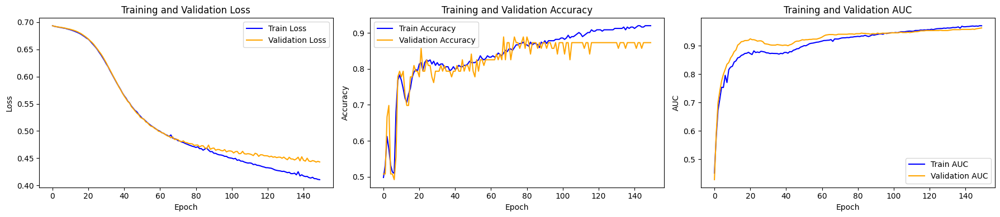

Training finished!
Test Accuracy: 0.7500
Test AUC: 1.0000


In [9]:
#### Block 4 #### 
### Training and validation ###
import torch
import torch.nn as nn
from torch.nn import Linear
import torch.nn.functional as F
from torch_geometric.nn import GCNConv, global_max_pool
from torch_geometric.data import DataLoader
from sklearn.metrics import accuracy_score, roc_auc_score
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split


# Set seed
torch.manual_seed(15706112877486103401)

# Network parameters
input_dim = 20  # Corresponds to amino acid OHE
hidden_dim = 64 # Neural network density
output_dim = 2  # Set model to binary classification

# Hyperparameters
num_epochs = 150
learning_rate = 0.001

# Define a GNN model
class MyGNN(nn.Module):
    def __init__(self, input_dim, hidden_dim, output_dim):
        super(MyGNN, self).__init__()
        self.conv1 = GCNConv(input_dim, hidden_dim)
        self.conv2 = GCNConv(hidden_dim, hidden_dim)
        self.lin = Linear(hidden_dim, output_dim)

    def forward(self, x, edge_index, batch):
        # Convert input tensor 'x' to Float data type
        x = x.float()
        
        # Apply the first graph convolution layer
        x = self.conv1(x, edge_index)
        x = x.relu()
    
        # Apply the second graph convolution layer
        x = self.conv2(x, edge_index)
        x = x.relu()
    
        # Perform graph-level pooling (e.g., global max pooling)
        x = global_max_pool(x, batch)
        x = self.lin(x)
        x = F.softmax(x, dim=1) 
    
        return x

# Initialize your GNN model
model = MyGNN(input_dim, hidden_dim, output_dim)

# Define batching
batch = next(iter(train_loader))
print(batch)

# Forward pass through the model
out = model(batch.x, batch.edge_index, batch.batch)

# Define optimization method
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate)

device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model.to(device)

# Empty containers for loss and accuracy metrics
train_losses = []
val_losses = []

train_accuracies = []
val_accuracies = []

train_aucs = []  # New list to store training AUC values
val_aucs = []  # New list to store validation AUC values

## Training and validation loops ##
for epoch in range(num_epochs):
    epoch_train_loss = 0.0
    total_correct_train = 0
    total_samples_train = 0
    train_predictions = []  # New list to store training predictions
    train_labels_all = []  # New list to store true training labels
    
    # Training loop
    model.train()
    train_correct_count = 0  # Total number of correct predictions for the epoch
    train_total_count = 0  # Total number of samples for the epoch

    # Validation loop
    model.eval()
    val_loss = 0.0
    total_correct_val = 0
    total_samples_val = 0
    val_predictions = []  # New list to store predictions
    val_labels_all = []  # New list to store true labels
    
    with torch.no_grad():
        for batch in val_loader:
            batch = batch.to(device)
            out = model(batch.x, batch.edge_index, batch.batch)
    
            labels = (batch.graph_y[:, 0] == 1).long()
    
            loss = F.cross_entropy(out, labels, reduction='sum')
            val_loss += loss.item()
    
            predicted_labels = out.argmax(dim=1)
            total_correct_val += (predicted_labels == labels).sum().item()
            total_samples_val += labels.size(0)
    
            # Store predictions and true labels for each batch
            val_predictions.extend(out[:, 1].cpu().numpy())  # Detach not needed for no_grad context
            val_labels_all.extend(labels.cpu().numpy())


    
    for batch in train_loader:
        batch = batch.to(device)
        optimizer.zero_grad()
        
        # Forward pass
        out = model(batch.x, batch.edge_index, batch.batch)
        
        # Convert graph_y to binary labels
        labels = (batch.graph_y[:, 0] == 1).long()
        
        # Compute loss
        loss = F.cross_entropy(out, labels, reduction='sum')
        epoch_train_loss += loss.item()
        
        # Backpropagation
        loss.backward()
        optimizer.step()
        
        # Calculate accuracy
        predicted_labels = out.argmax(dim=1)
        train_correct_count += (predicted_labels == labels).sum().item()
        train_total_count += labels.size(0)
        
        # Store predictions and true labels for each batch
        train_predictions.extend(out[:, 1].detach().cpu().numpy())  # Detach the tensor before converting to numpy
        train_labels_all.extend(labels.detach().cpu().numpy())
    
    avg_train_loss = epoch_train_loss / len(train_loader.dataset)
    train_losses.append(avg_train_loss)
    
    # Calculate training accuracy
    train_accuracy = train_correct_count / train_total_count
    train_accuracies.append(train_accuracy)
    
    # Calculate AUC-ROC for training data
    train_auc = roc_auc_score(train_labels_all, train_predictions)
    train_aucs.append(train_auc)
    
    
    # Calculate average validation loss
    avg_val_loss = val_loss / len(val_loader.dataset)
    val_losses.append(avg_val_loss)
    
    # Calculate overall validation accuracy using all true labels
    val_accuracy = total_correct_val / total_samples_val
    val_accuracies.append(val_accuracy)
    
    # Calculate AUC-ROC for validation data
    val_auc = roc_auc_score(val_labels_all, val_predictions)
    val_aucs.append(val_auc)
    
    print(f"Epoch [{epoch+1}/{num_epochs}] - Train Loss: {avg_train_loss:.4f} - Train Accuracy: {train_accuracy:.4f} - Train AUC: {train_auc:.4f} - Validation Loss: {avg_val_loss:.4f} - Validation Accuracy: {val_accuracy:.4f} - Validation AUC: {val_auc:.4f}")

# Plotting the training progress
plt.figure(figsize=(18, 4))

plt.subplot(1, 3, 1)
plt.plot(train_losses, label='Train Loss', color='blue')
plt.plot(val_losses, label='Validation Loss', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()

plt.subplot(1, 3, 2)
plt.plot(train_accuracies, label='Train Accuracy', color='blue')
plt.plot(val_accuracies, label='Validation Accuracy', color='orange')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()

plt.subplot(1, 3, 3)
plt.plot(train_aucs, label='Train AUC', color='blue')
plt.plot(val_aucs, label='Validation AUC', color='orange')
plt.xlabel('Epoch')
plt.ylabel('AUC')
plt.title('Training and Validation AUC')
plt.legend()

plt.tight_layout()
plt.show()

print("Training finished!")

### Test data ###
import torch
import torch.nn.functional as F
from torch_geometric.loader import DataLoader
from sklearn.metrics import accuracy_score, roc_auc_score

# Assuming you have your test data in a DataLoader called test_loader
# If you don't have one, create it similarly to how you created train_loader and val_loader.

# Set the model to evaluation mode
model.eval()

# Initialize variables for accuracy calculation
total_correct_test = 0
total_samples_test = 0

# Lists to store predictions and true labels for potential further analysis
test_predictions = []
test_labels = []
test_probabilities = []  # New list to store probabilities for AUC

# Iterate through the test DataLoader
with torch.no_grad():
    for batch in test_loader:
        batch = batch.to(device)  # Send data to GPU if available
        out = model(batch.x, batch.edge_index, batch.batch)
        
        # Convert graph_y to binary labels
        labels = (batch.graph_y[:, 0] == 1).long()
        
        # Calculate predictions
        predicted_labels = out.argmax(dim=1)
        
        # Accumulate the number of correct predictions and total samples
        total_correct_test += (predicted_labels == labels).sum().item()
        total_samples_test += labels.size(0)

        # Store predictions and true labels
        test_predictions.extend(predicted_labels.cpu().numpy())
        test_labels.extend(labels.cpu().numpy())
        test_probabilities.extend(out[:, 1].cpu().numpy())  # Store the probabilities for the positive class

# Calculate test accuracy
test_accuracy = accuracy_score(test_labels, test_predictions)

# Calculate test AUC
test_auc = roc_auc_score(test_labels, test_probabilities)

# Report the test accuracy and AUC
print(f"Test Accuracy: {test_accuracy:.4f}")
print(f"Test AUC: {test_auc:.4f}")


In [11]:
import torch
torch.save(model.state_dict(), '######.pth')
print("Model saved successfully!")

Model saved successfully!


In [12]:
# Initialize the model structure
model = MyGNN(input_dim, hidden_dim, output_dim)

# Load the saved model parameters
model.load_state_dict(torch.load('20240912_DHvsER_150eoch.pth'))

# Make sure the model is in evaluation mode if you're using it for inference
model.eval()

MyGNN(
  (conv1): GCNConv(20, 64)
  (conv2): GCNConv(64, 64)
  (lin): Linear(in_features=64, out_features=2, bias=True)
)

Processing batch with 63 graphs
Explanation for graph sfaH_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


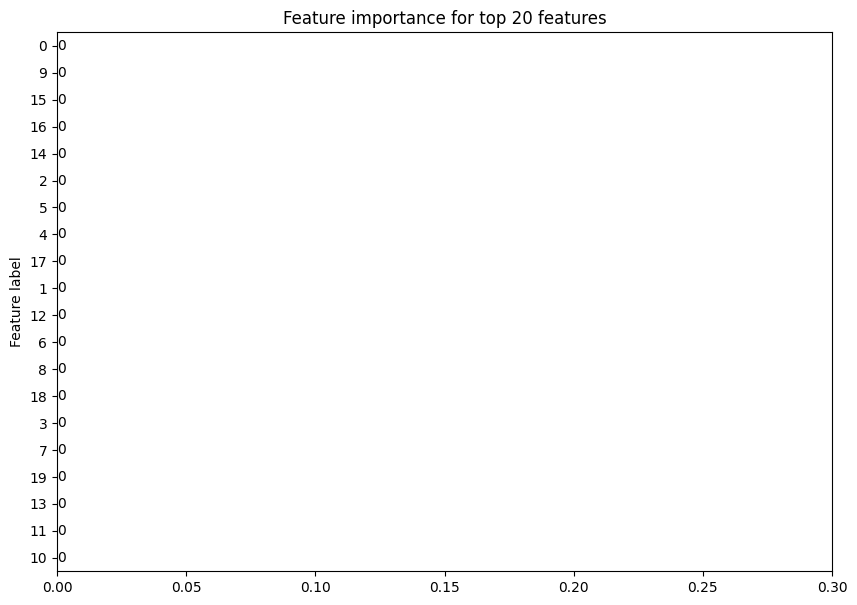

Explanation for graph megAIII_Mod.1.pdb_aligned: tensor([4.0651e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7775e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


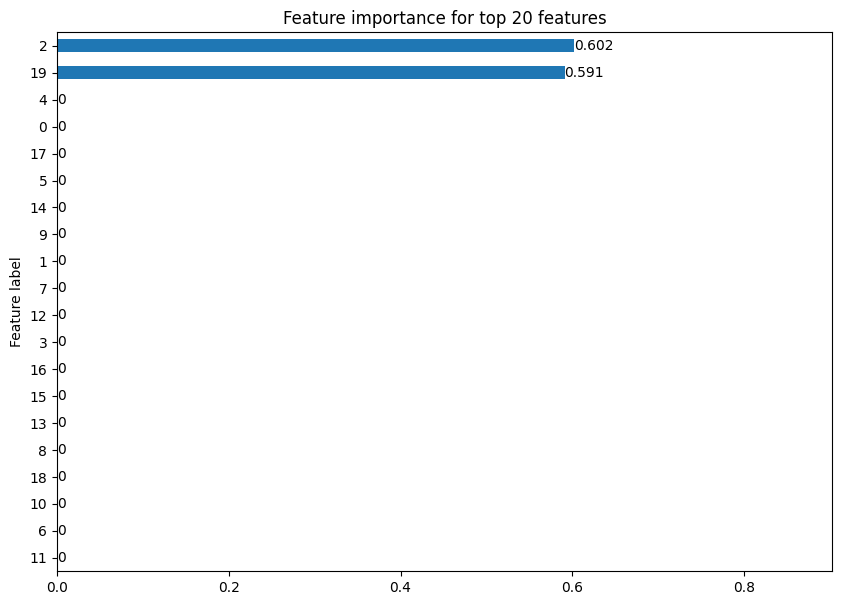

Explanation for graph sfaH_Mod.2.pdb_aligned: tensor([3.5418e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


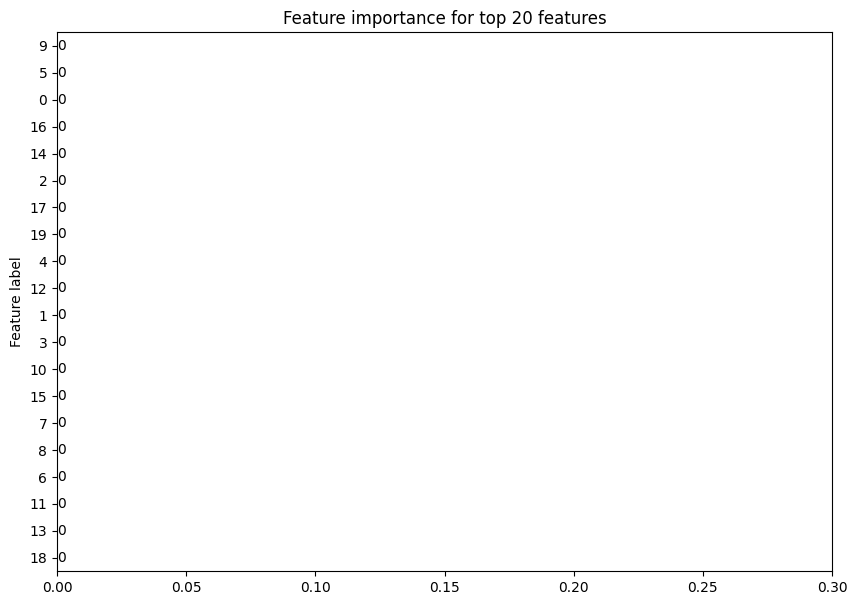

Explanation for graph monAVI_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


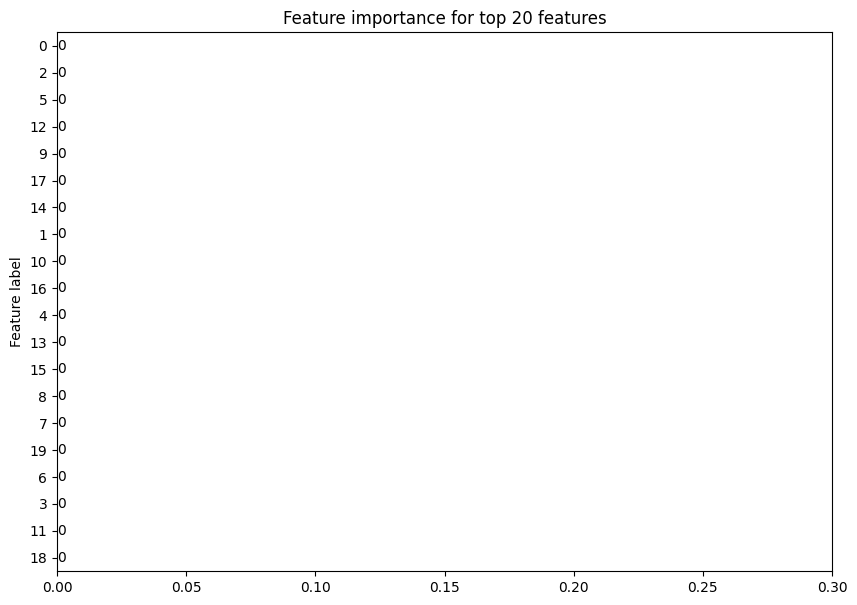

Explanation for graph StamG_Mod.17.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


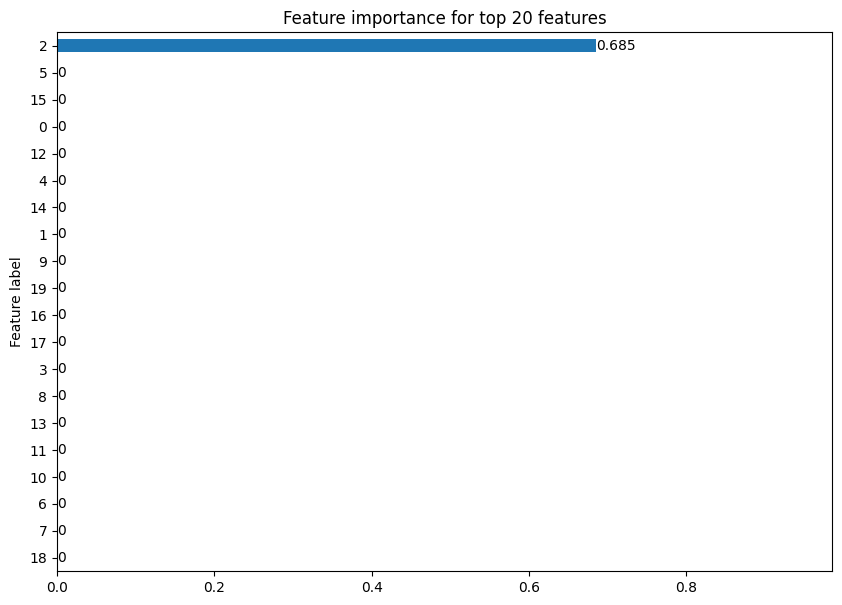

Explanation for graph scnS2_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


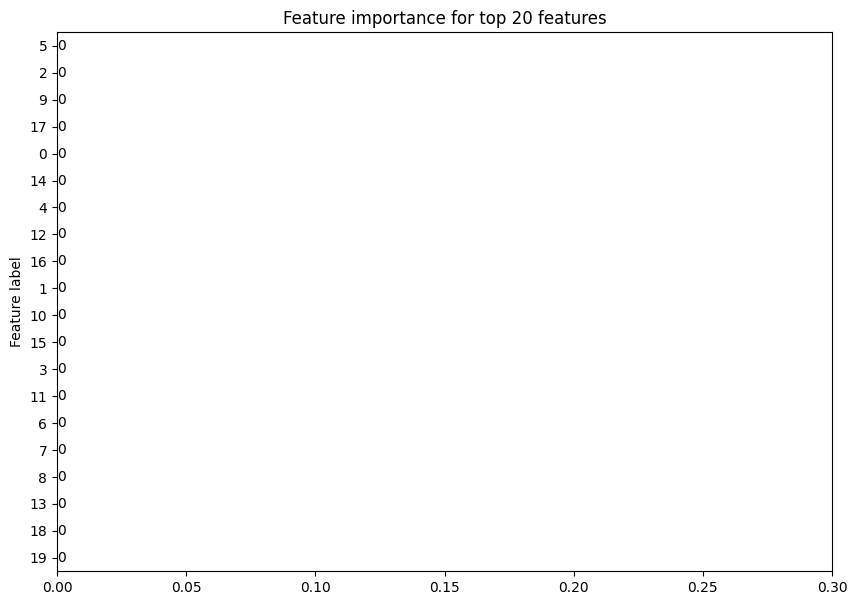

Explanation for graph cxmE_Mod.11.pdb_aligned: tensor([1., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.0387e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


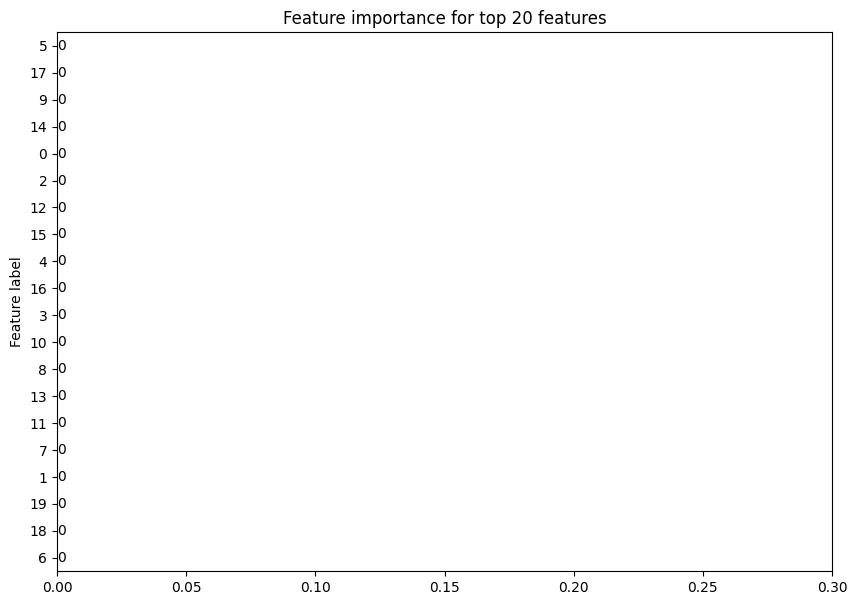

Explanation for graph nbrG_Mod.4.pdb_aligned: tensor([3.5456e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.1733e-10, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


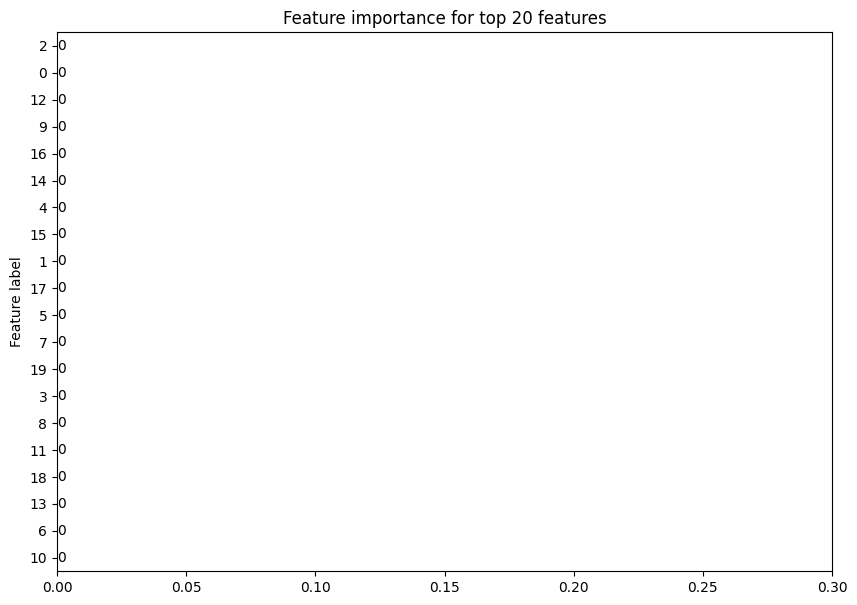

Explanation for graph NigAI_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.5063e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 4.5227e-10, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


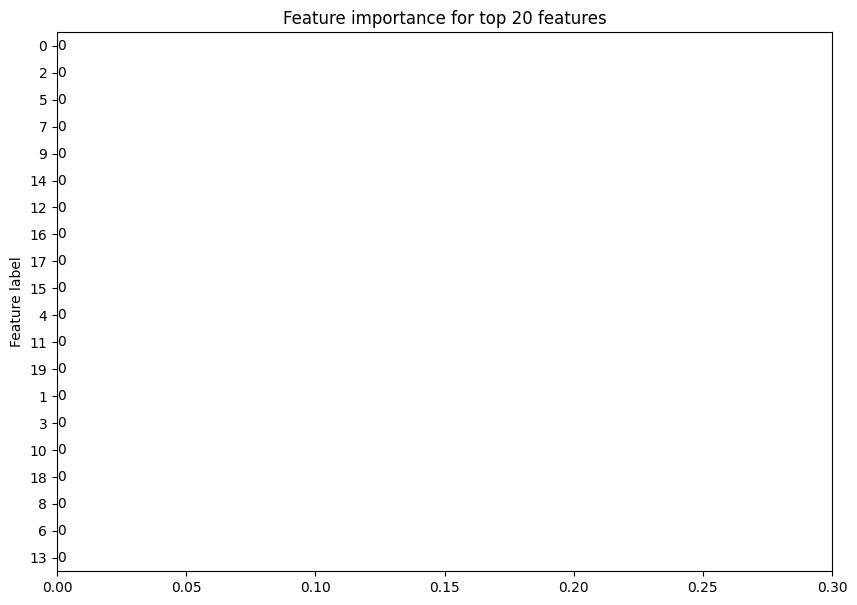

Explanation for graph scnS1_Mod.4.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


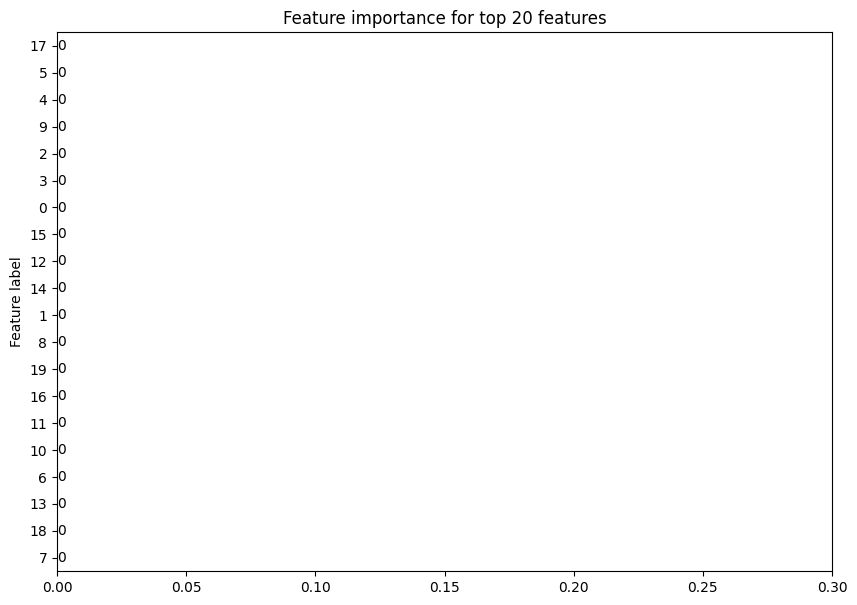

Explanation for graph fscB_Mod.3.pdb_aligned: tensor([5.2371e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7936e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


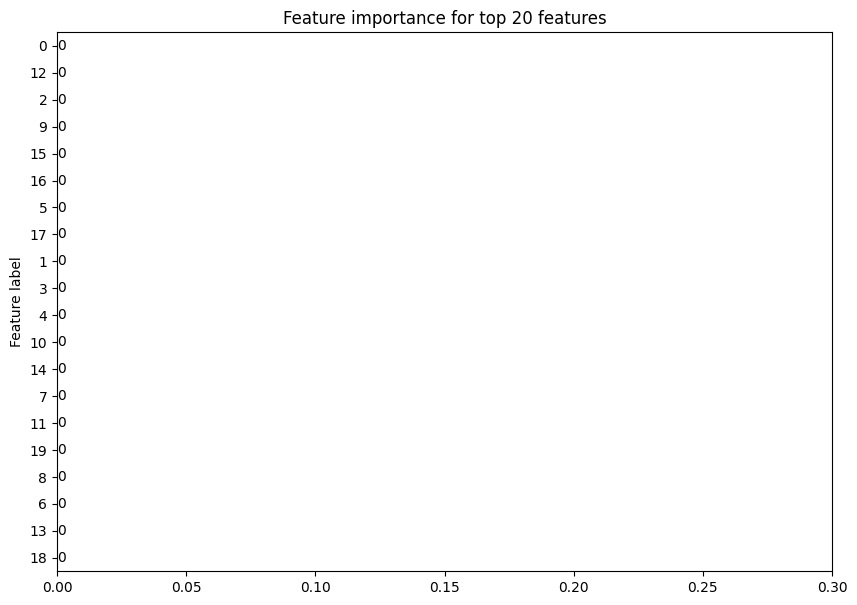

Explanation for graph cle6_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


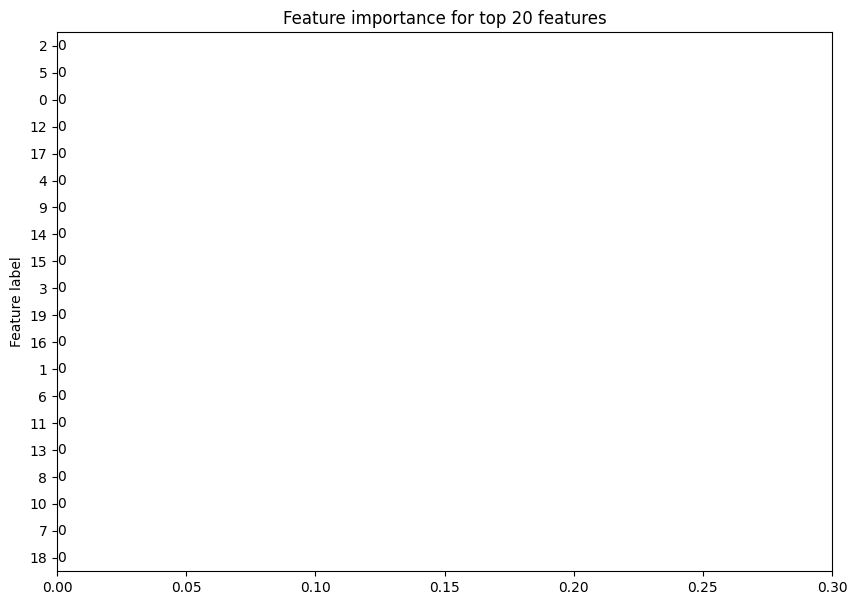

Explanation for graph mlsA1_Mod.6.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 4.6696e-10, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


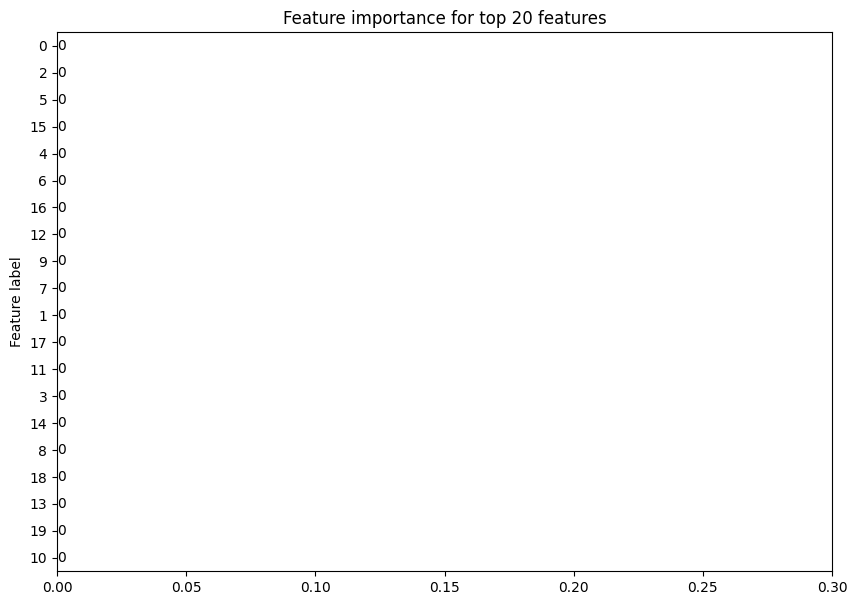

Explanation for graph gerSII_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


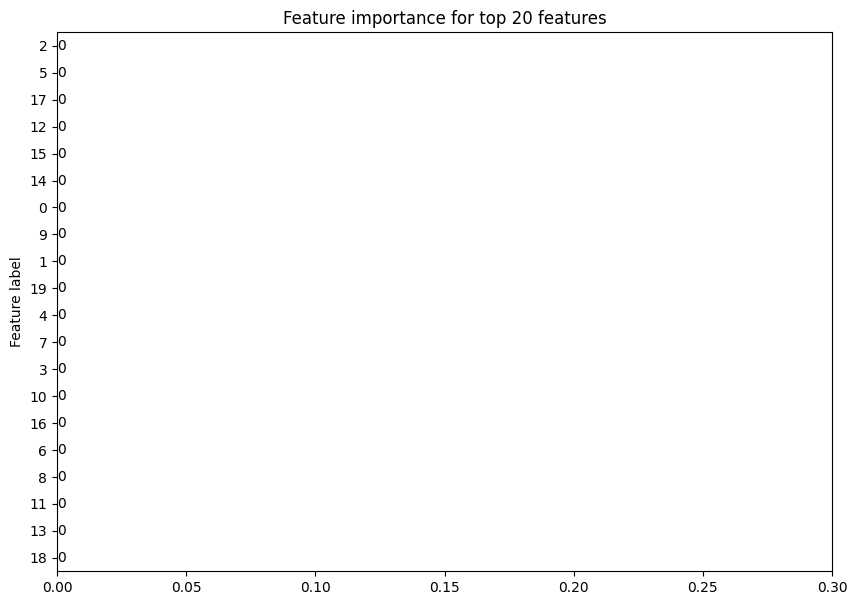

Explanation for graph epoD_Mod.1.pdb_aligned: tensor([2.7361e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


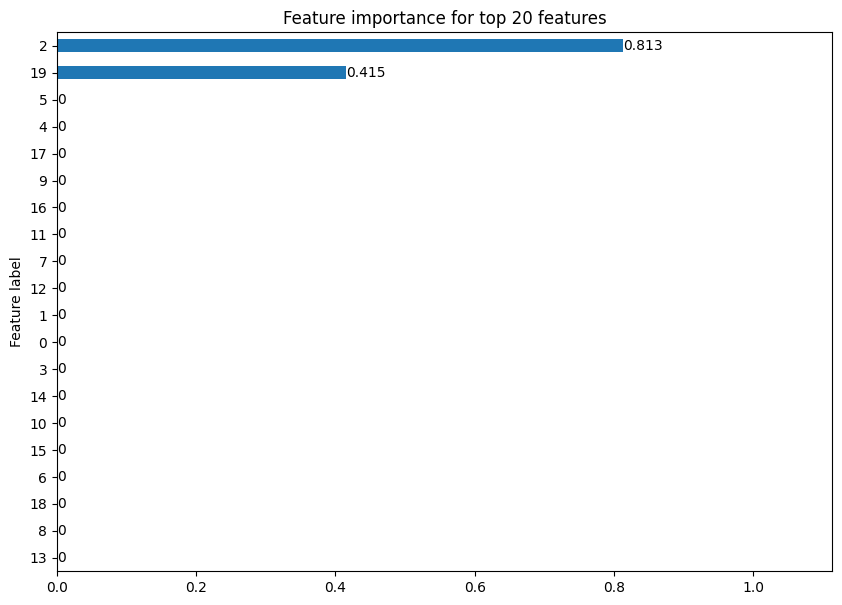

Explanation for graph ebeC_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 4.4935e-10, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


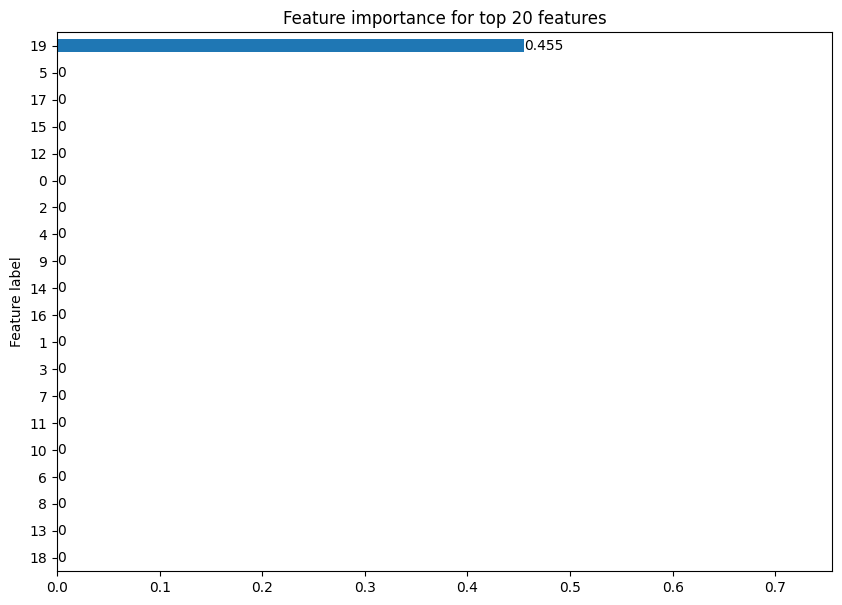

Explanation for graph acuAIV_Mod.1.pdb_aligned: tensor([1., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.4531e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


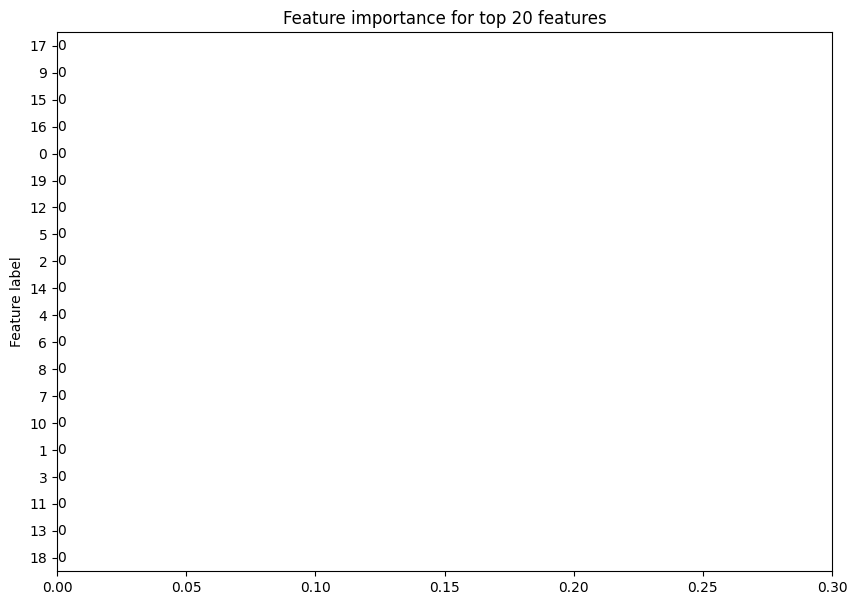

Explanation for graph arpPII_Mod.2.pdb_aligned: tensor([4.9827e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


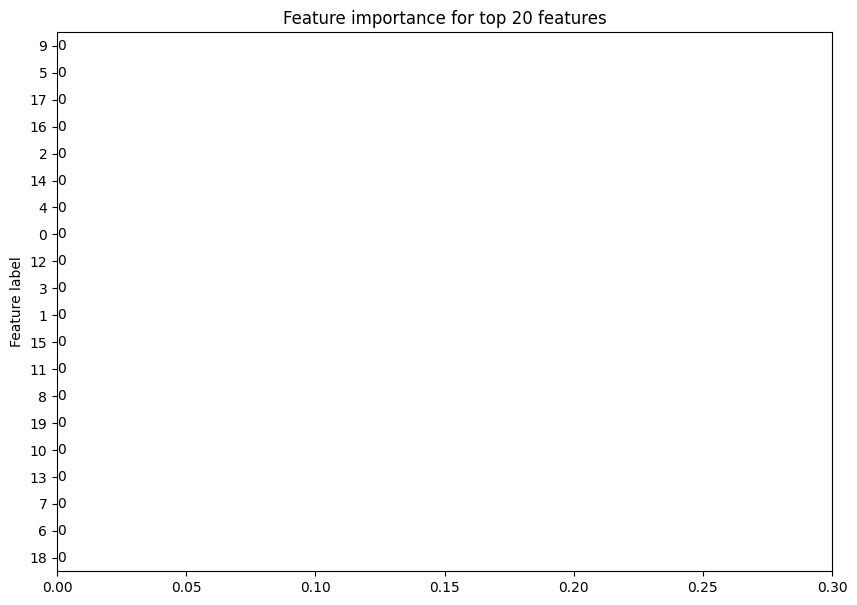

Explanation for graph vstA3_Mod.2.pdb_aligned: tensor([3.8855e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


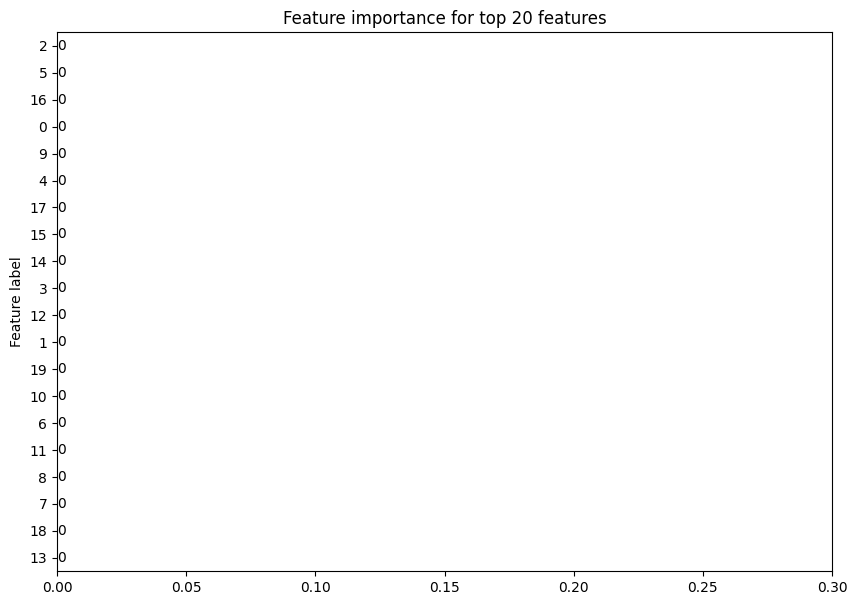

Explanation for graph chmGV_Mod.1.pdb_aligned: tensor([3.6030e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4562e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


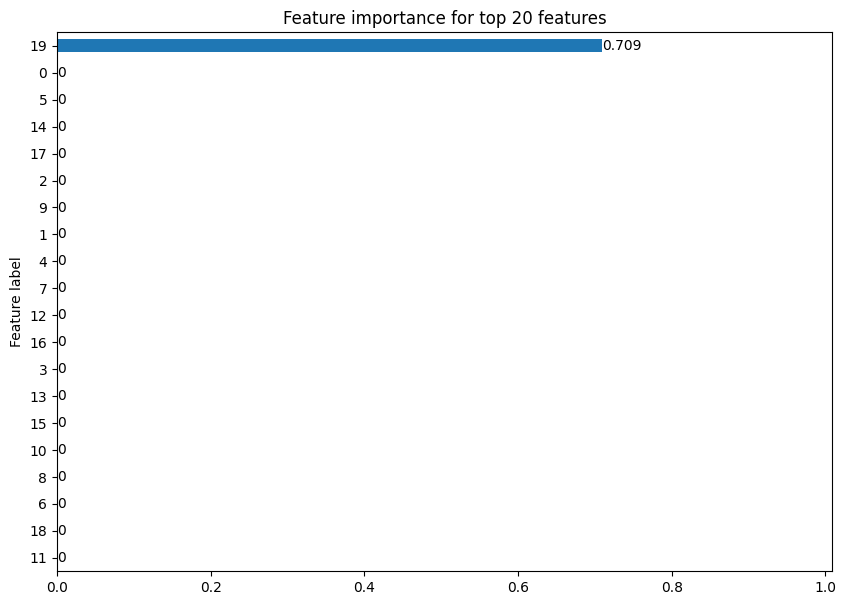

Explanation for graph pimS4_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


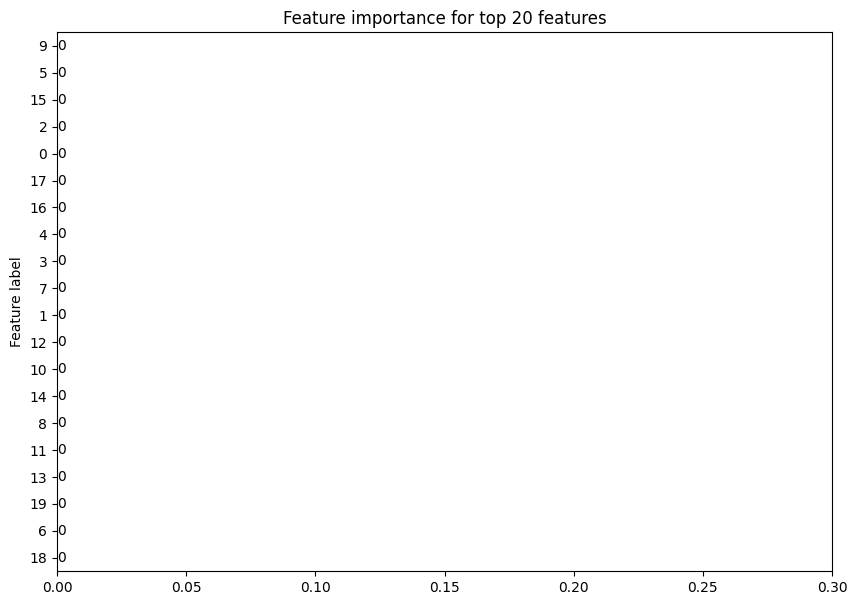

Explanation for graph ChlA2_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[3.5232e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.3900e-10, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


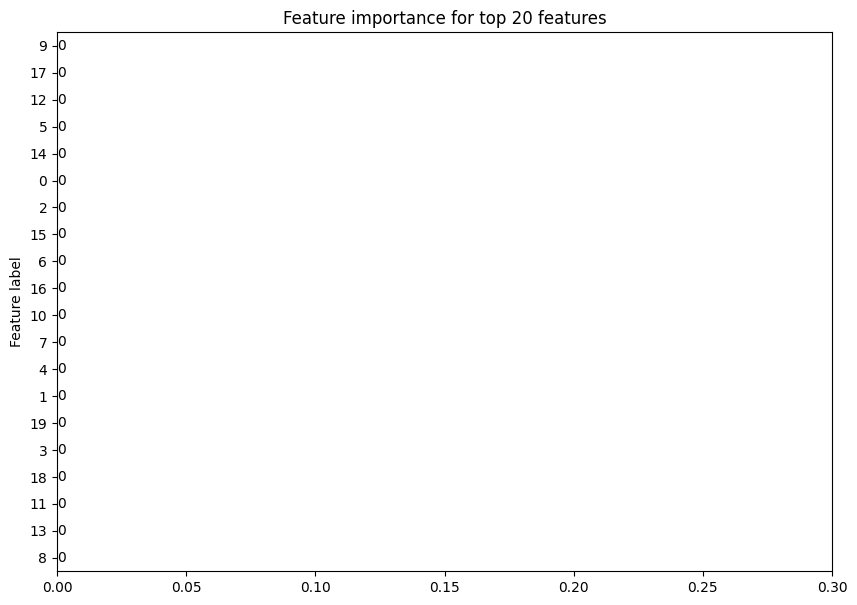

Explanation for graph ladSIV_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


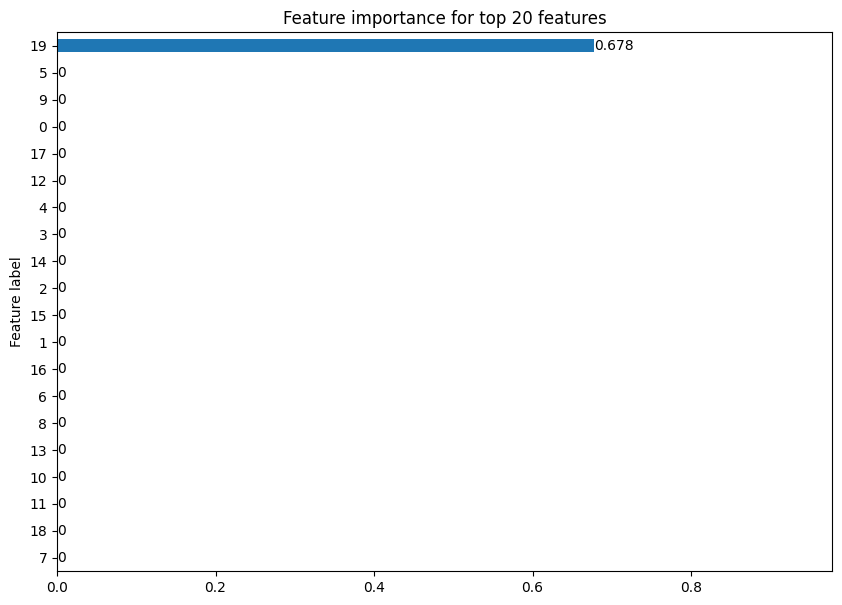

Explanation for graph meiA2_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


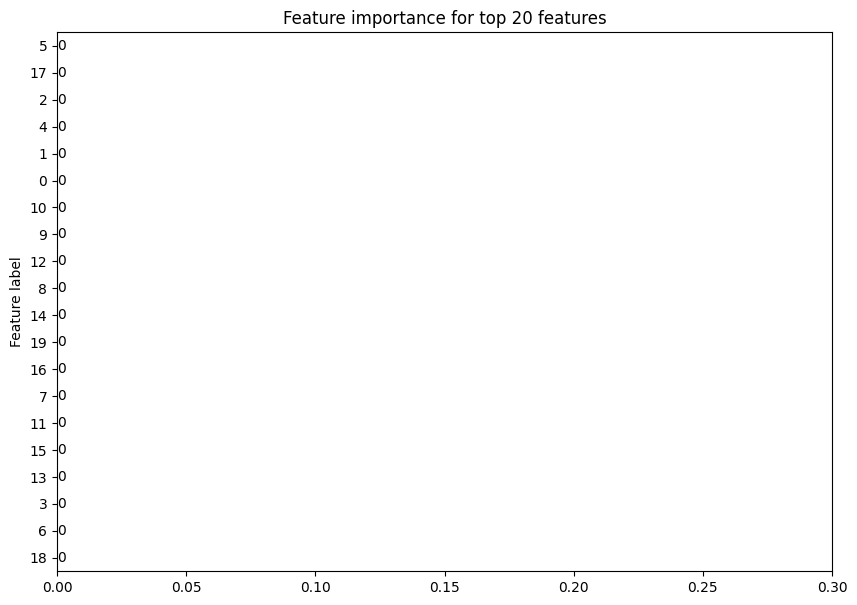

Explanation for graph SeEryAIII_Mod.1.pdb_aligned: tensor([3.4877e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


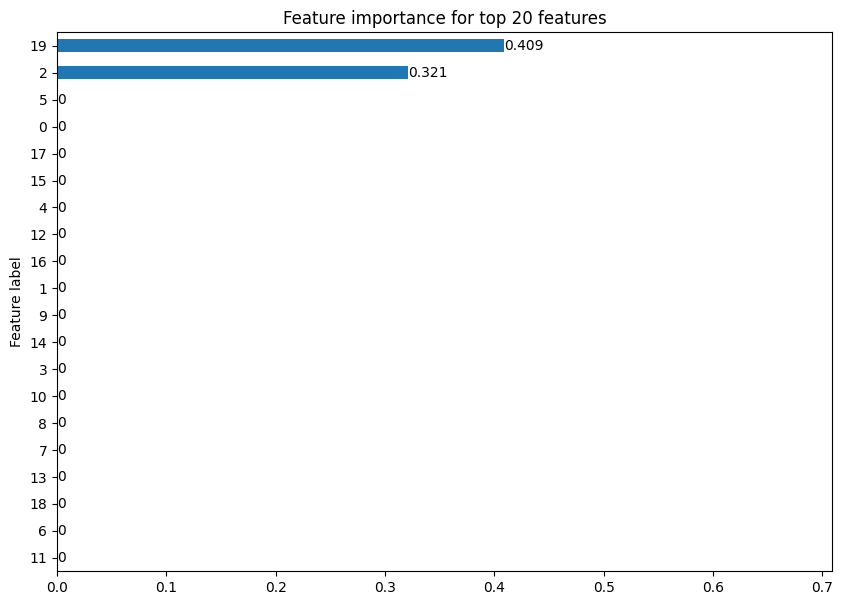

Explanation for graph hitP4_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


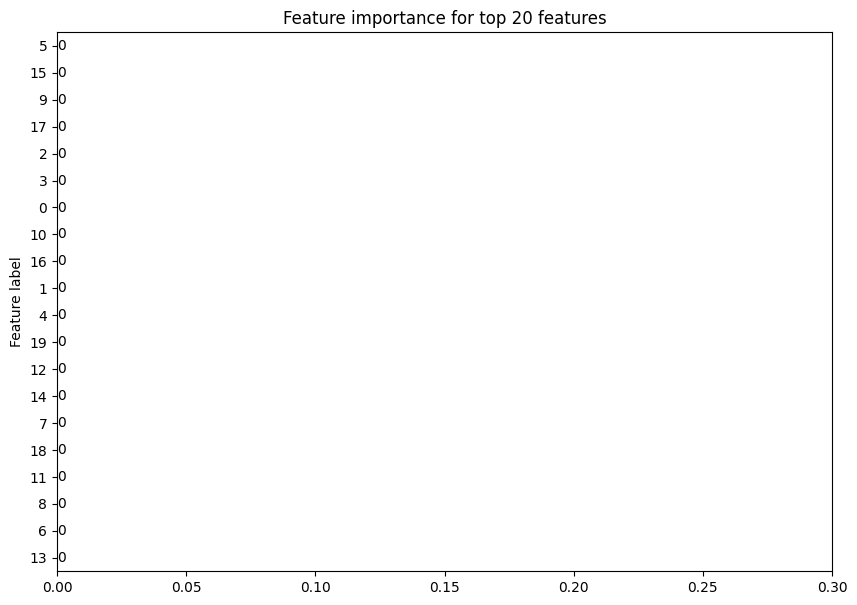

Explanation for graph TamAII_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


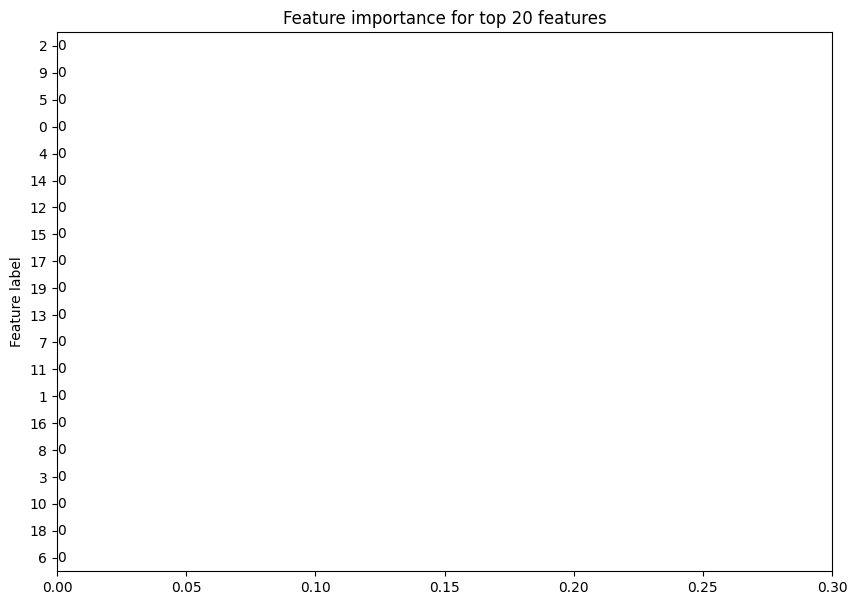

Explanation for graph angAIV_Mod.1.pdb_aligned: tensor([4.2391e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


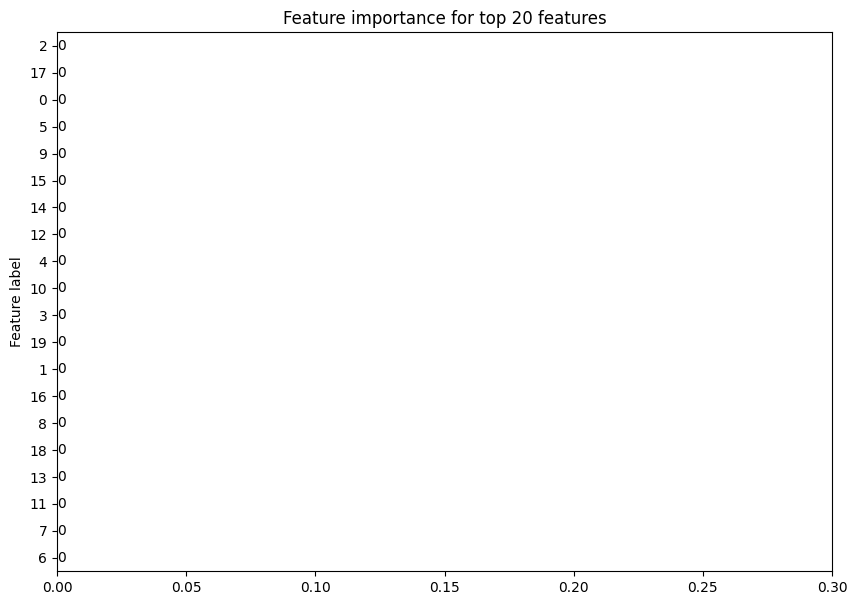

Explanation for graph aalA3_Mod.2.pdb_aligned: tensor([3.0241e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


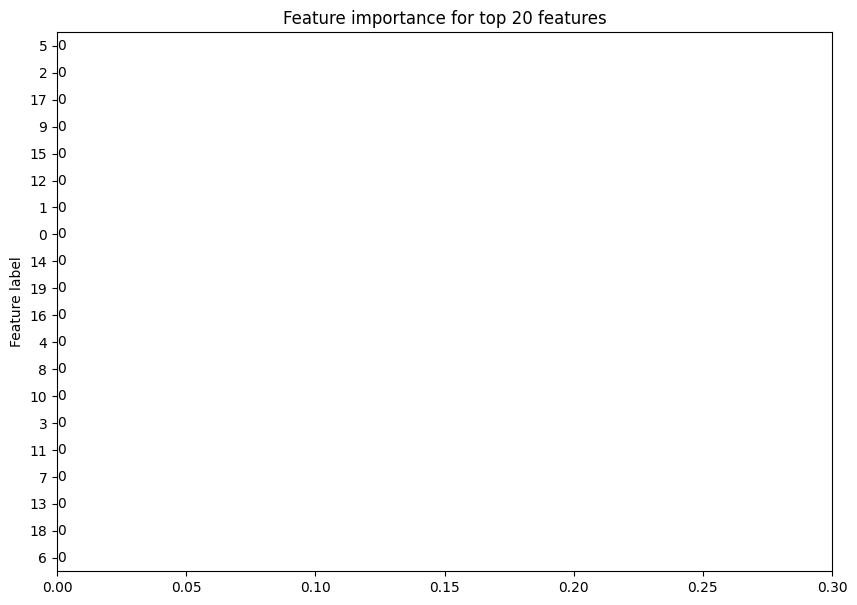

Explanation for graph fscC_Mod.6.pdb_aligned: tensor([4.1765e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


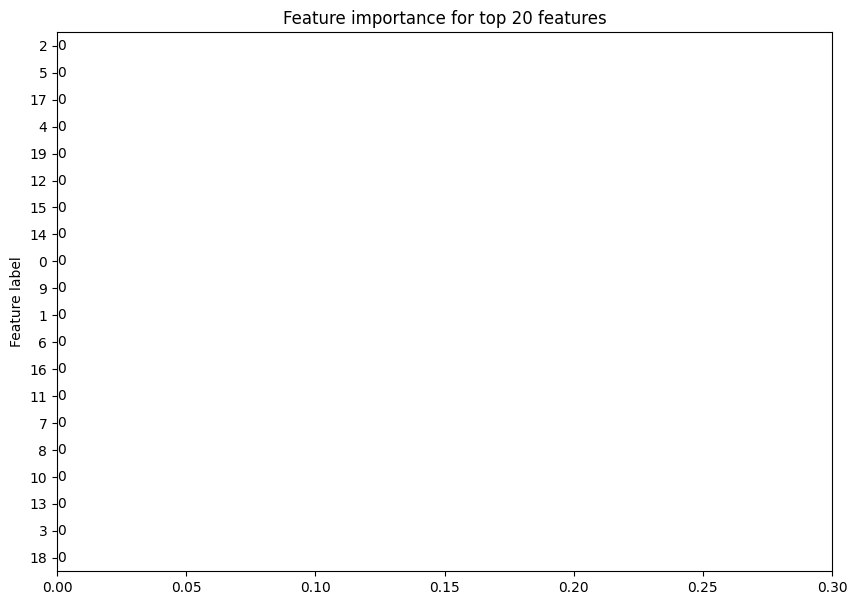

Explanation for graph lydG_Mod.15.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


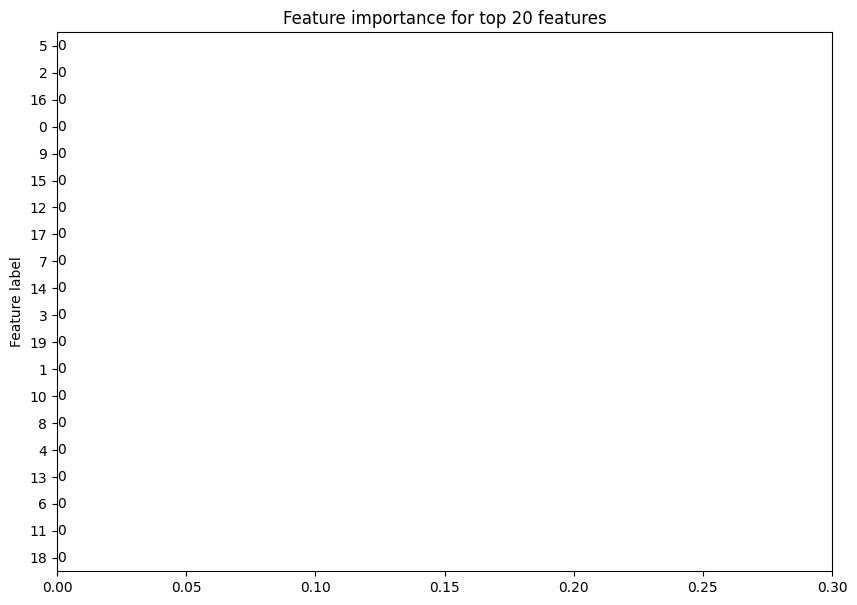

Explanation for graph jerC_Mod.3.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


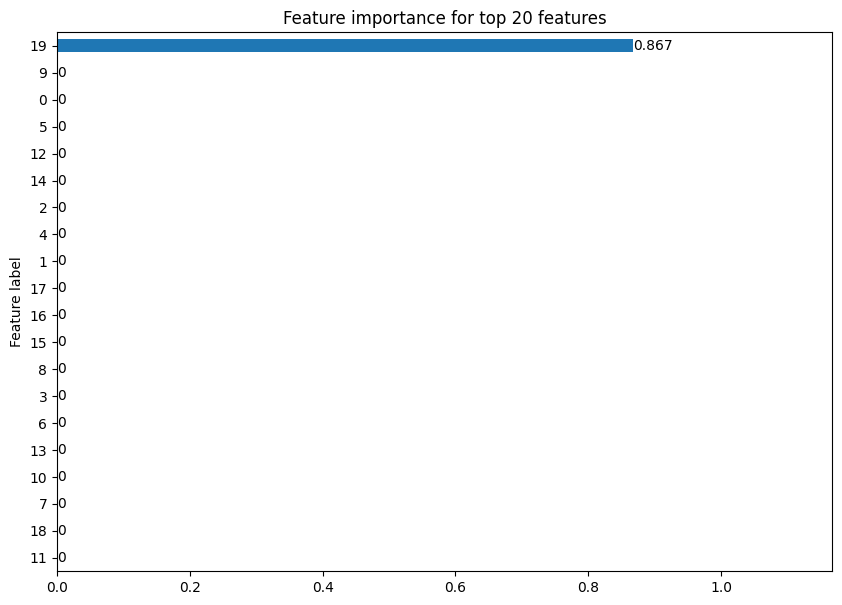

Explanation for graph hbmAII_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.2171e-10, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


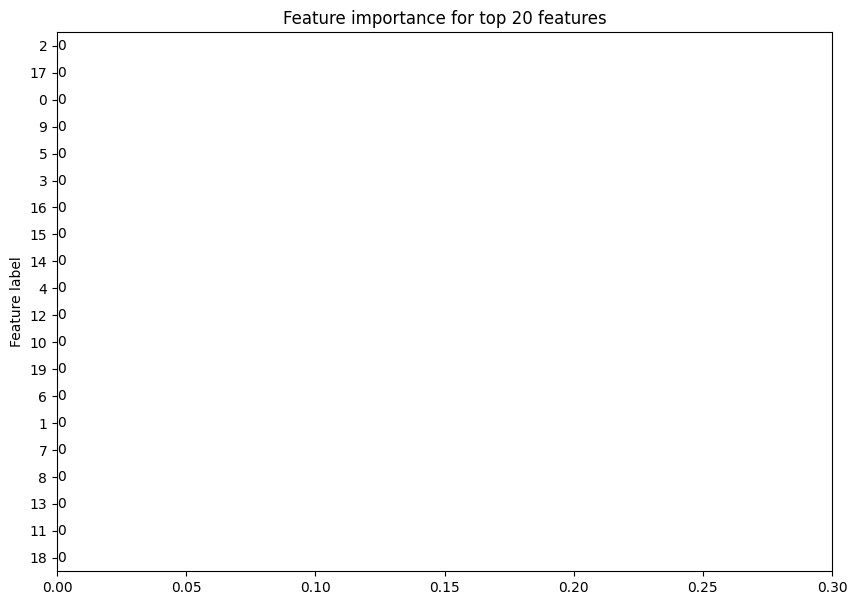

Explanation for graph hgcA_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


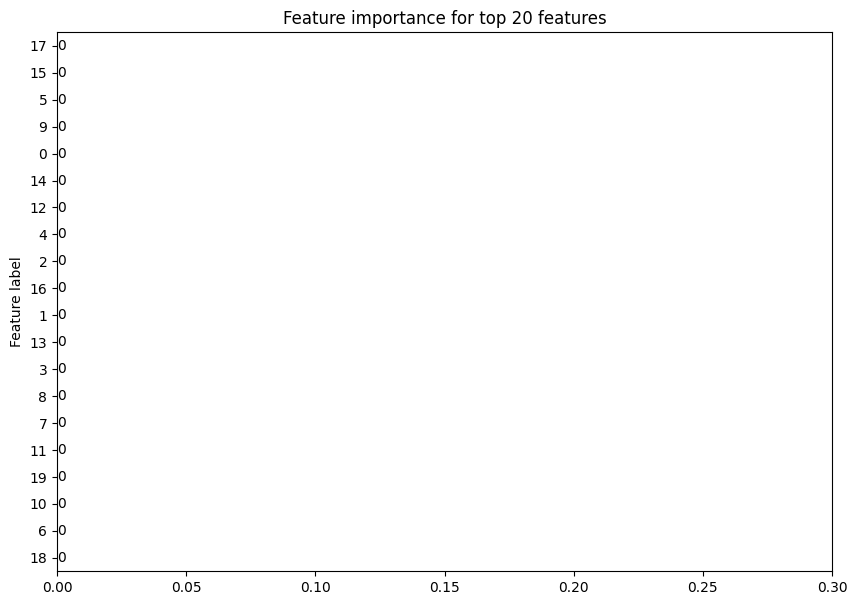

Explanation for graph slnA9_Mod.1.pdb_aligned: tensor([4.9303e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


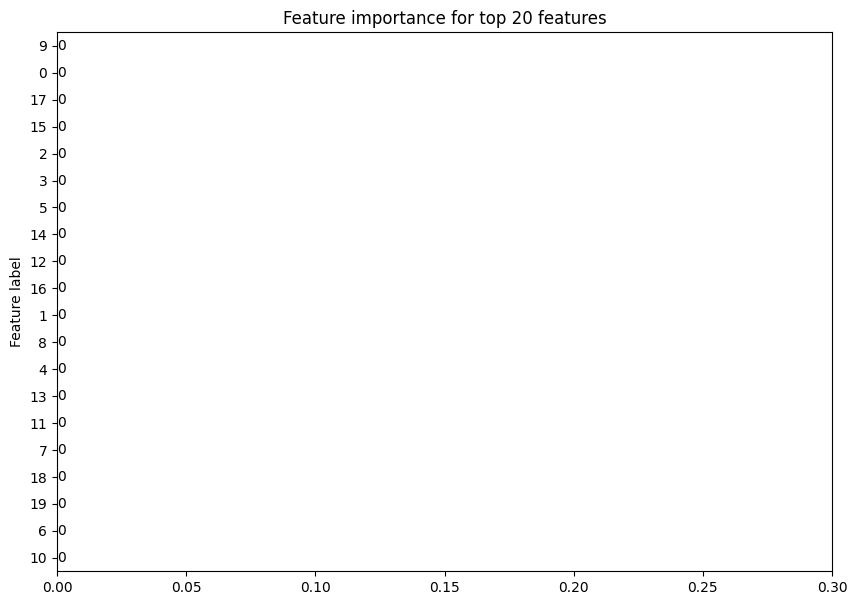

Explanation for graph nbrH_Mod.1.pdb_aligned: tensor([3.2552e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


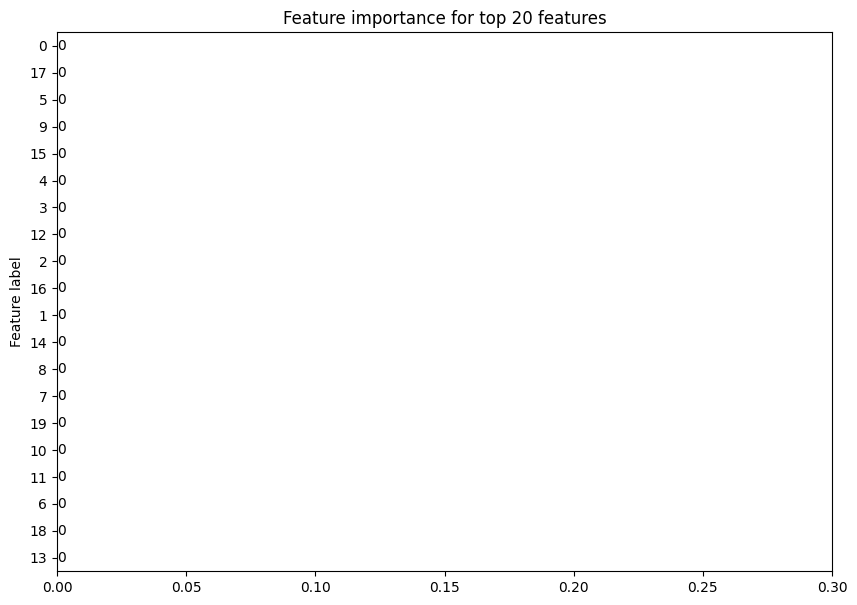

Explanation for graph lasAII_Mod.3.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


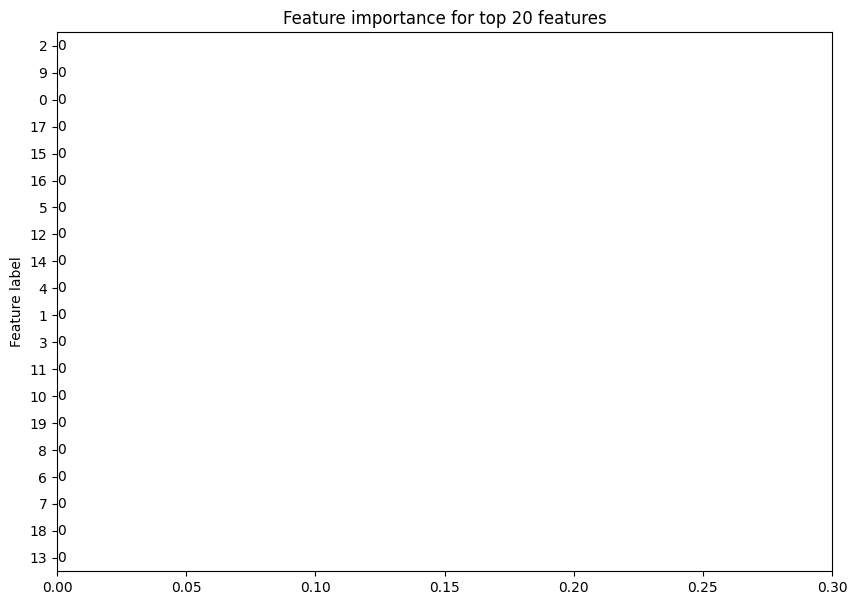

Explanation for graph npmD_Mod.5.pdb_aligned: tensor([3.8317e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


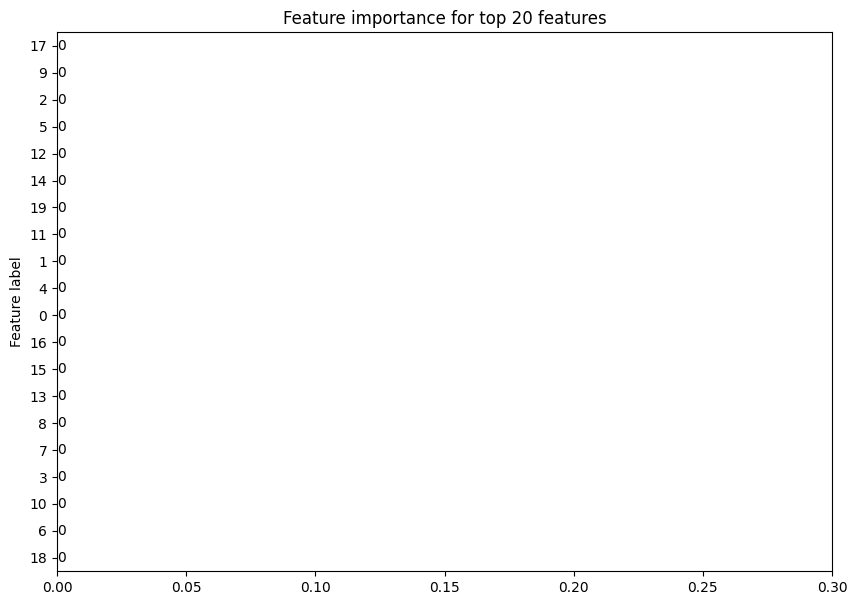

Explanation for graph jerE_Mod.6.pdb_aligned: tensor([4.0050e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


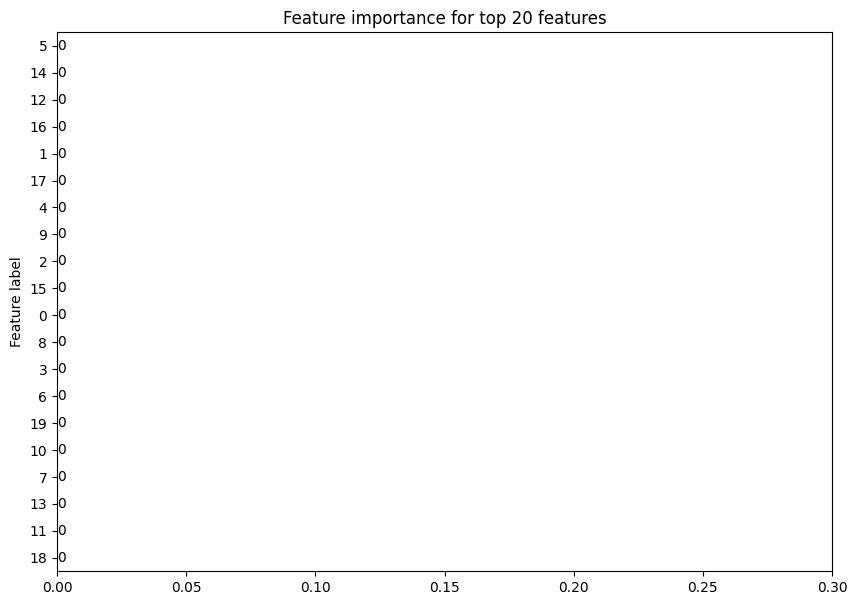

Explanation for graph btlC_Mod.6.pdb_aligned: tensor([1.0000e+00, 0.0000e+00, 4.4126e-11,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.7822e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


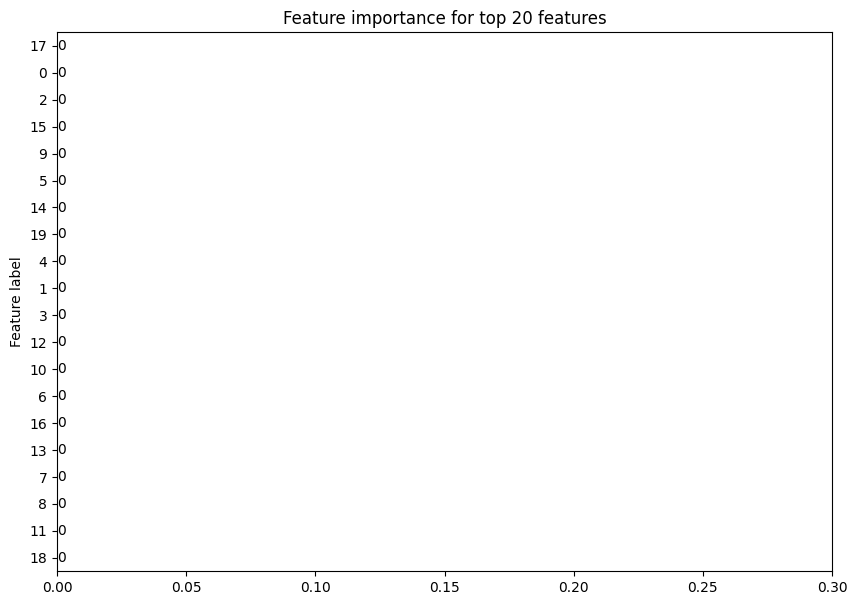

Explanation for graph fscC_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


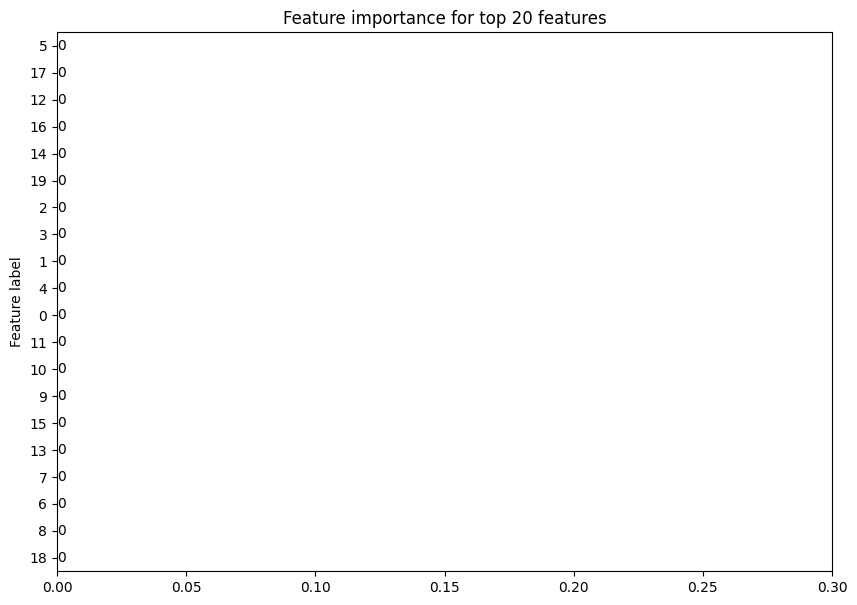

Explanation for graph conF_Mod.13.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


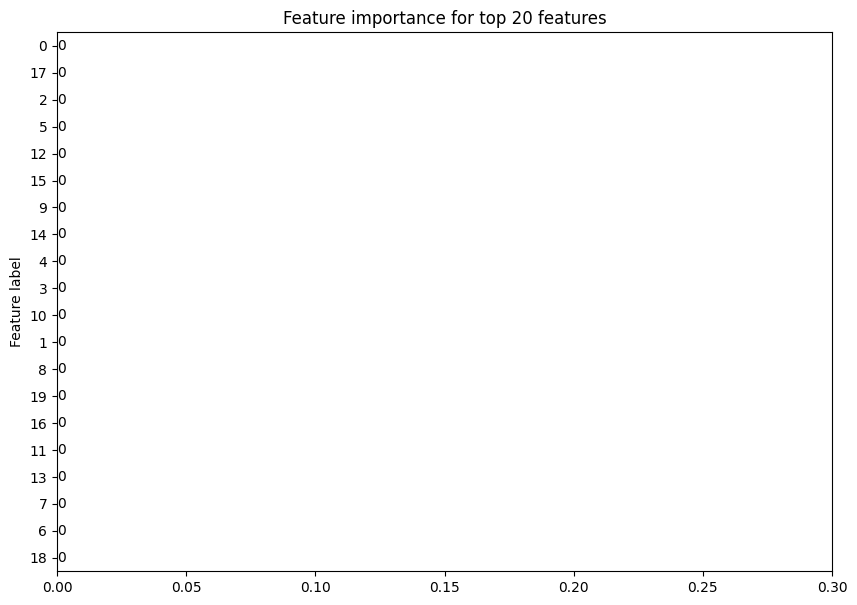

Explanation for graph kijA_Mod.8.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


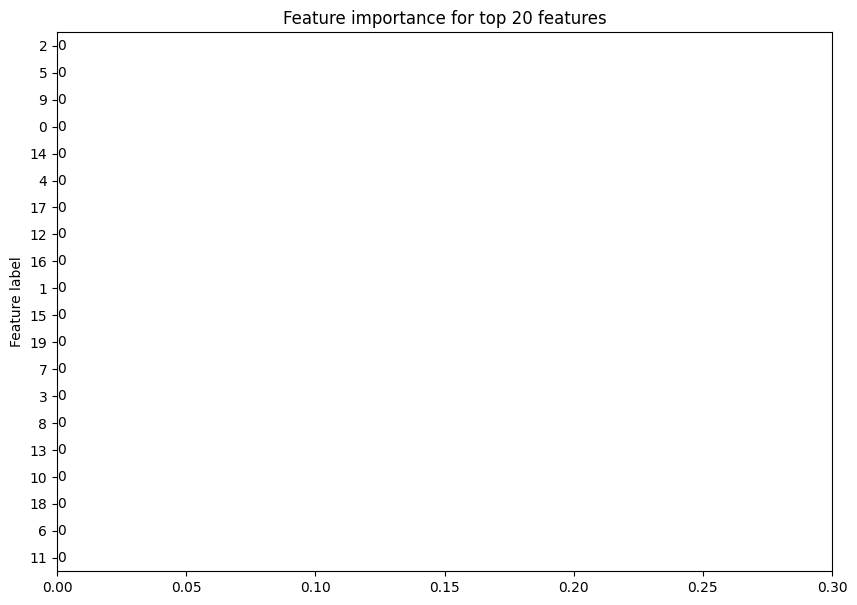

Explanation for graph tmnA1_Mod.3.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


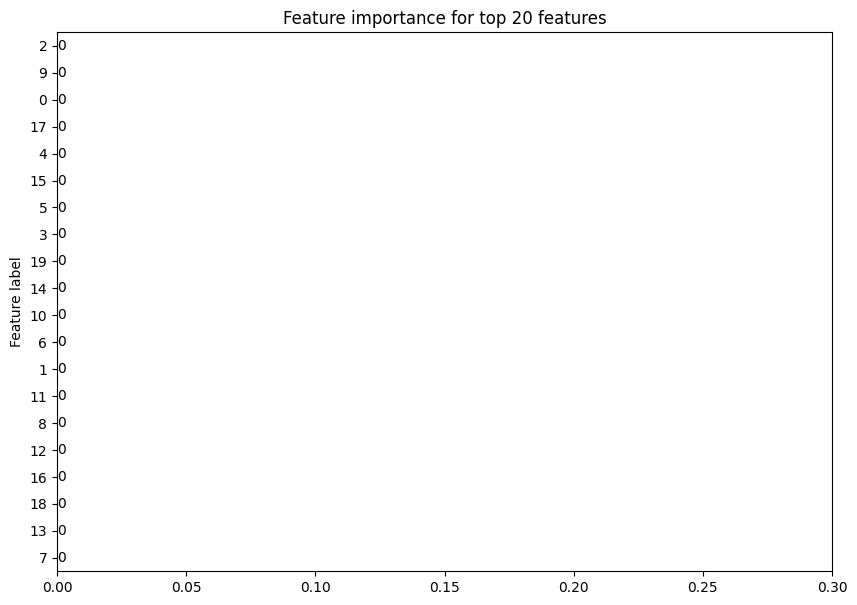

Explanation for graph fosC_Mod.1.pdb_aligned: tensor([5.0381e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


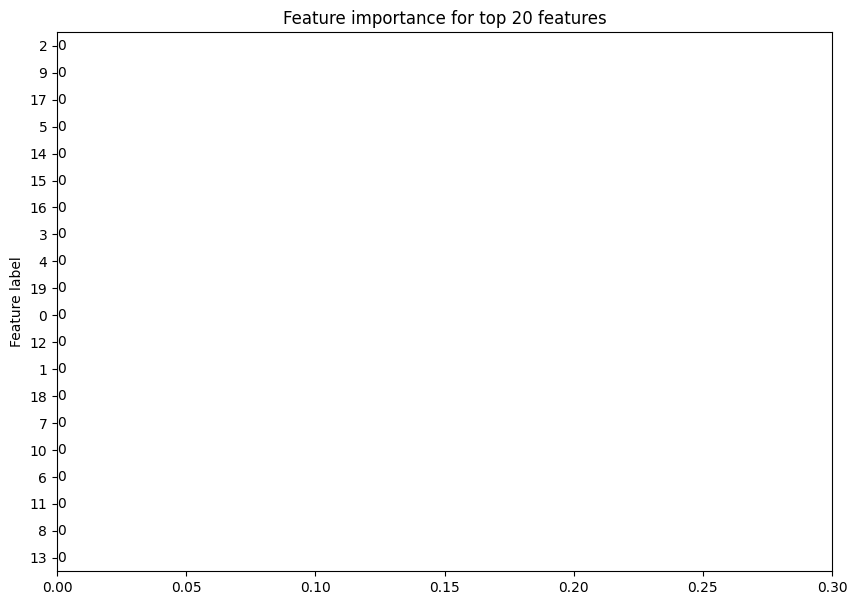

Explanation for graph cle6_Mod.4.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


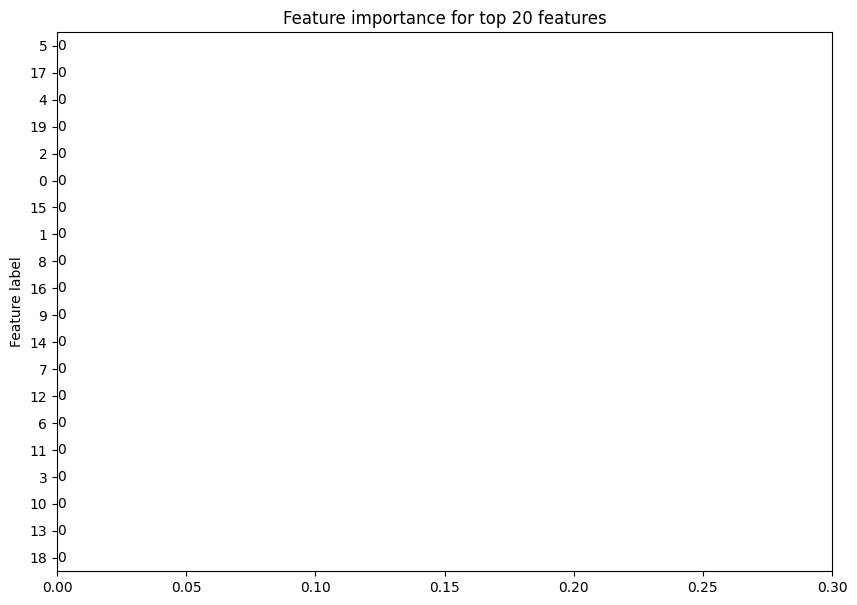

Explanation for graph zinB_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


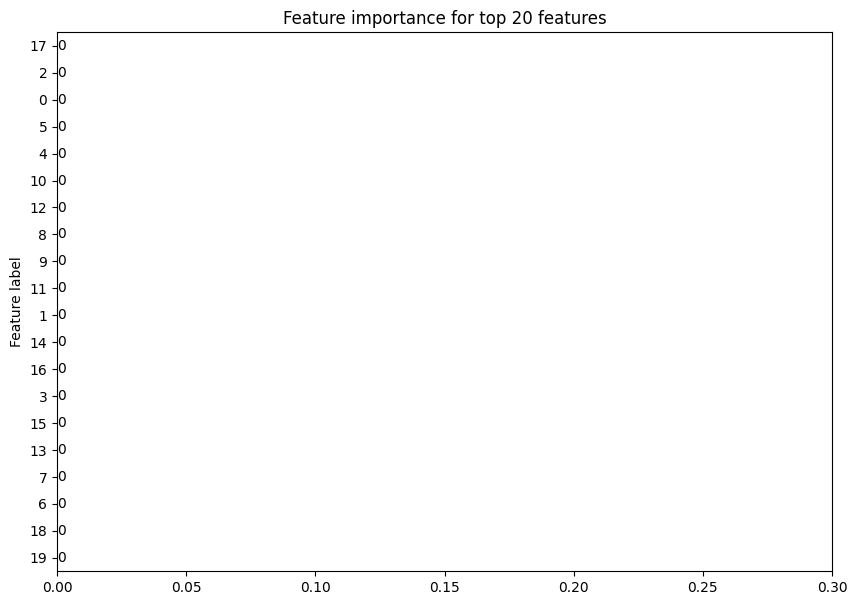

Explanation for graph cppC_Mod.6.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


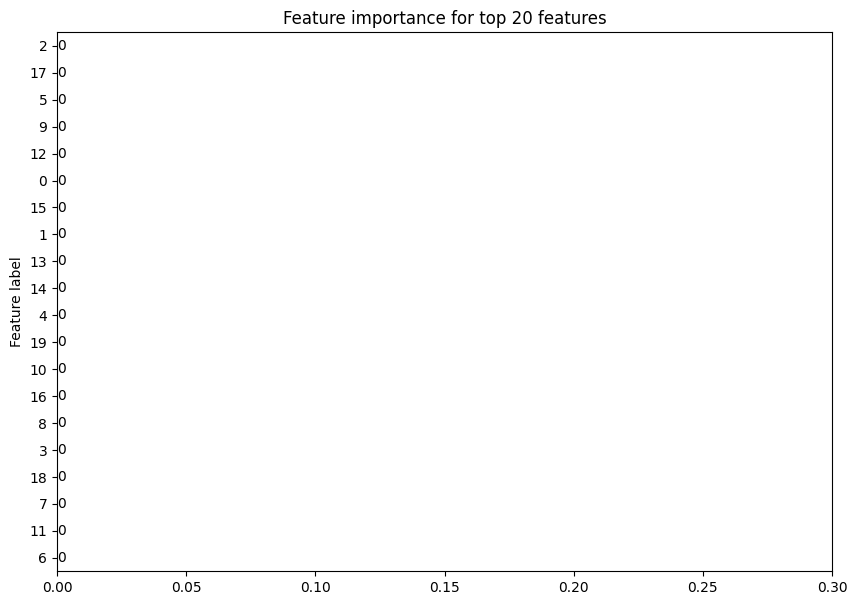

Explanation for graph lkmAIII_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


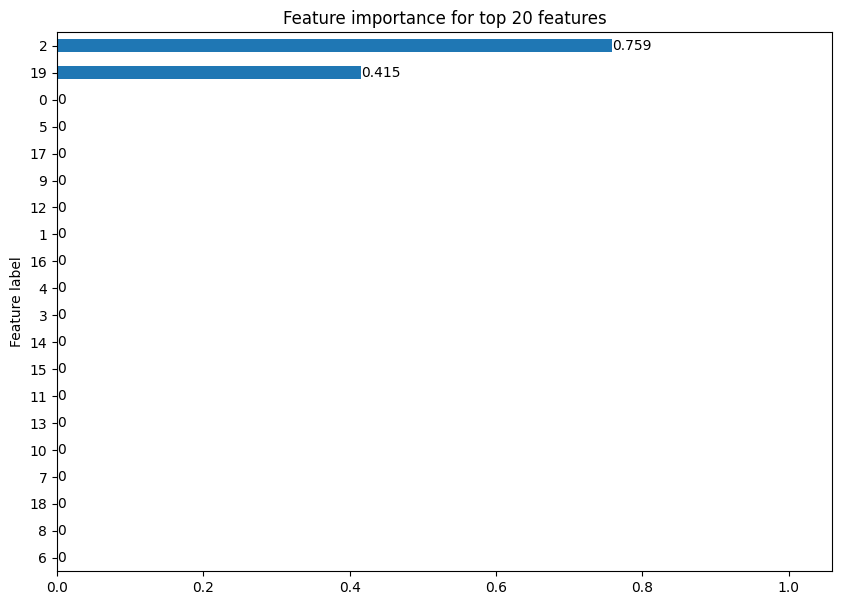

Explanation for graph hitP2_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


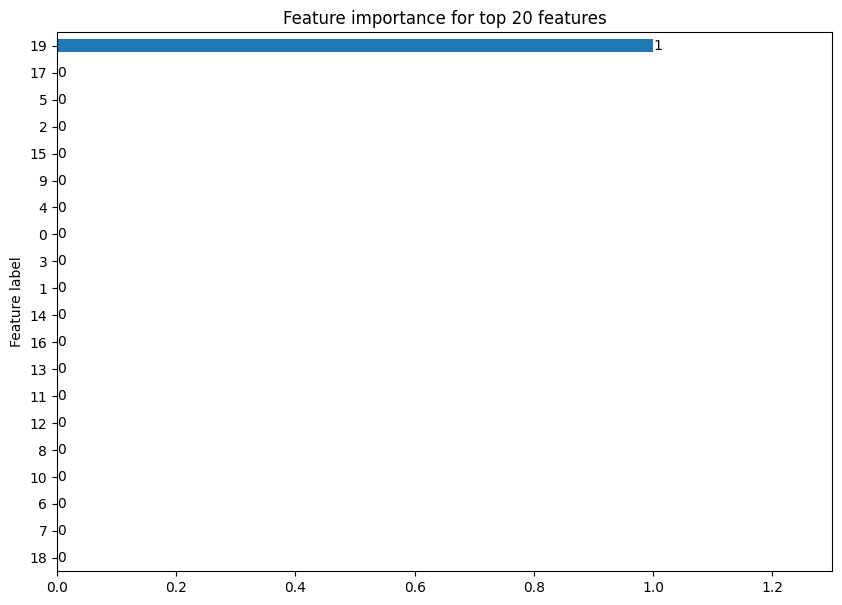

Explanation for graph rapA_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


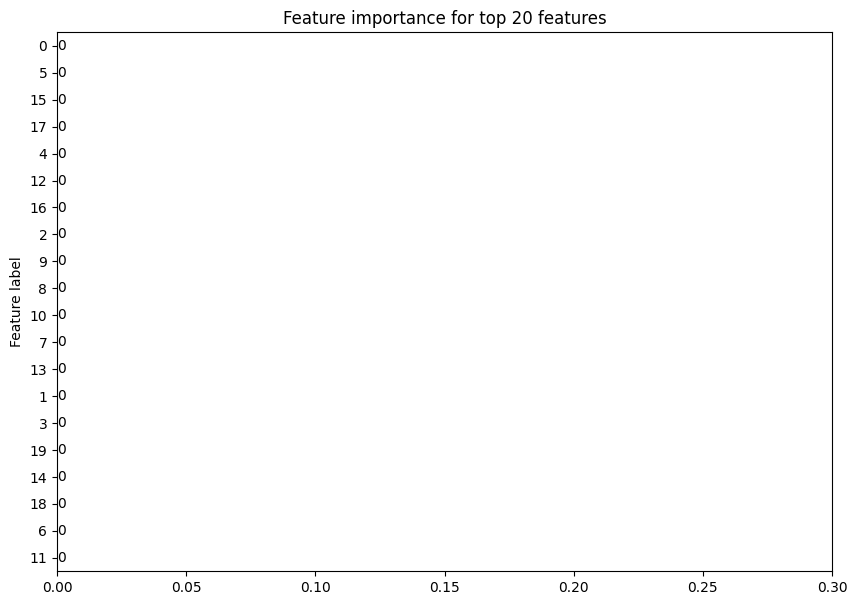

Explanation for graph leoA_Mod.2.pdb_aligned: tensor([0.0000e+00, 0.0000e+00, 4.0642e-11,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.5384e-10, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


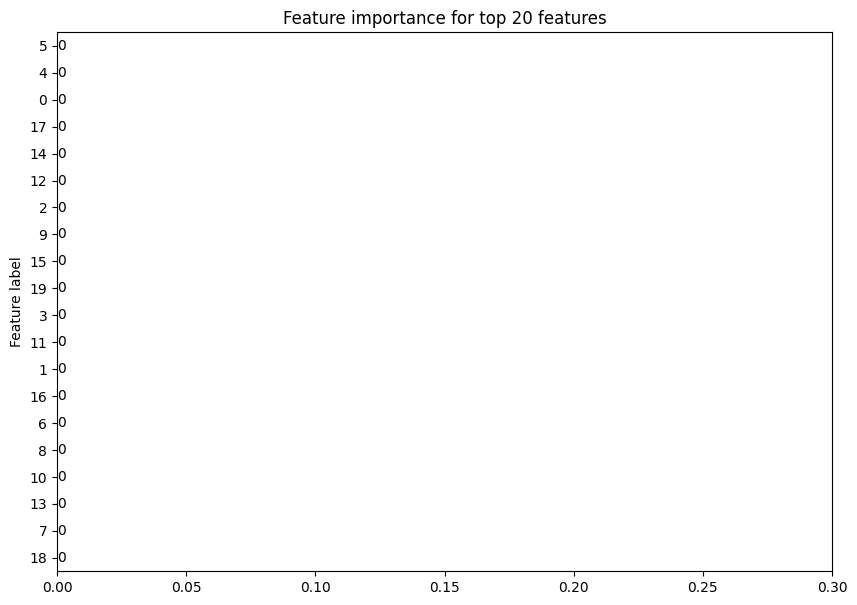

Explanation for graph tsnAIV_Mod.3.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


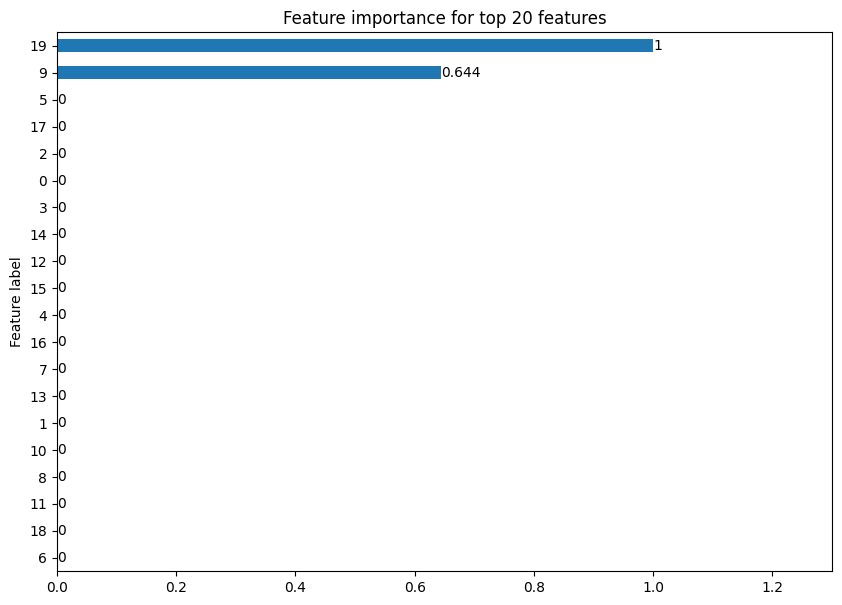

Explanation for graph idnP1_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


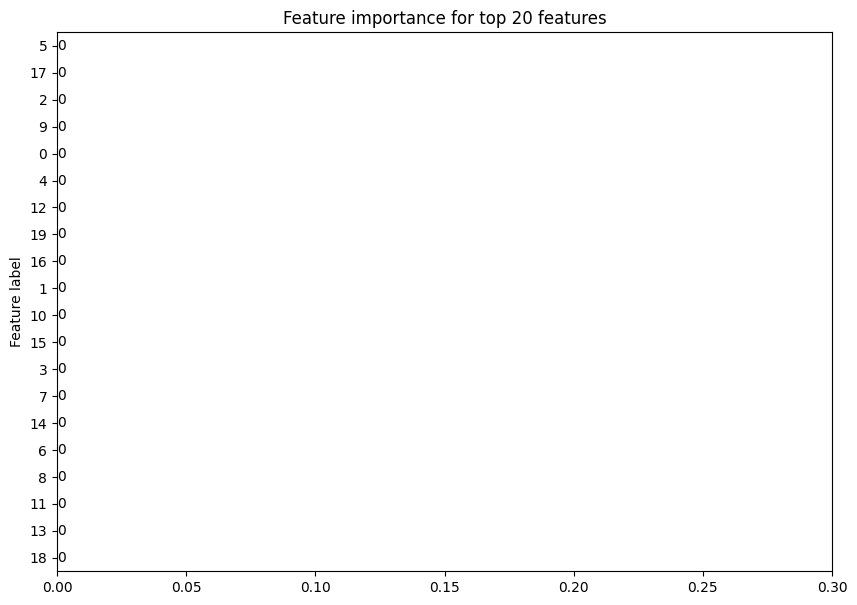

Explanation for graph gfsD_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.3284e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


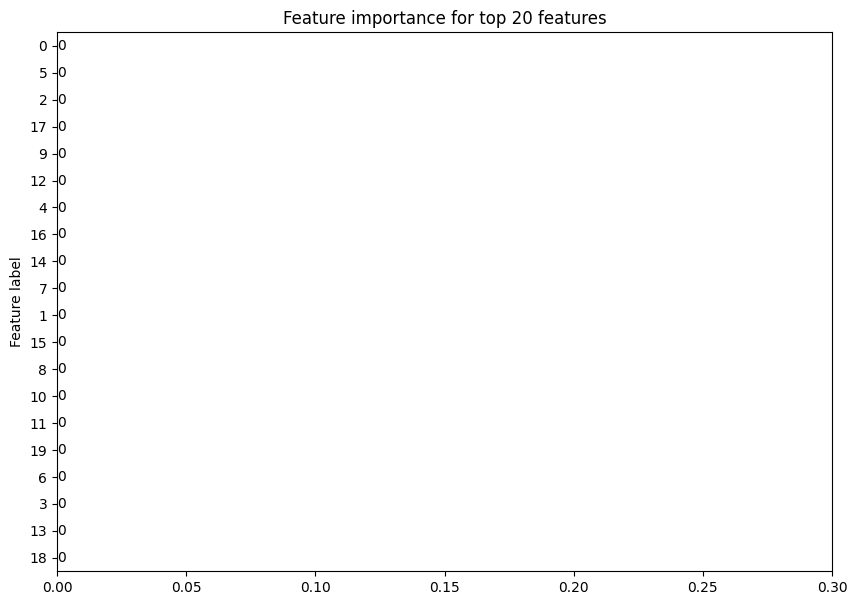

Explanation for graph sfaH_Mod.3.pdb_aligned: tensor([3.1392e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


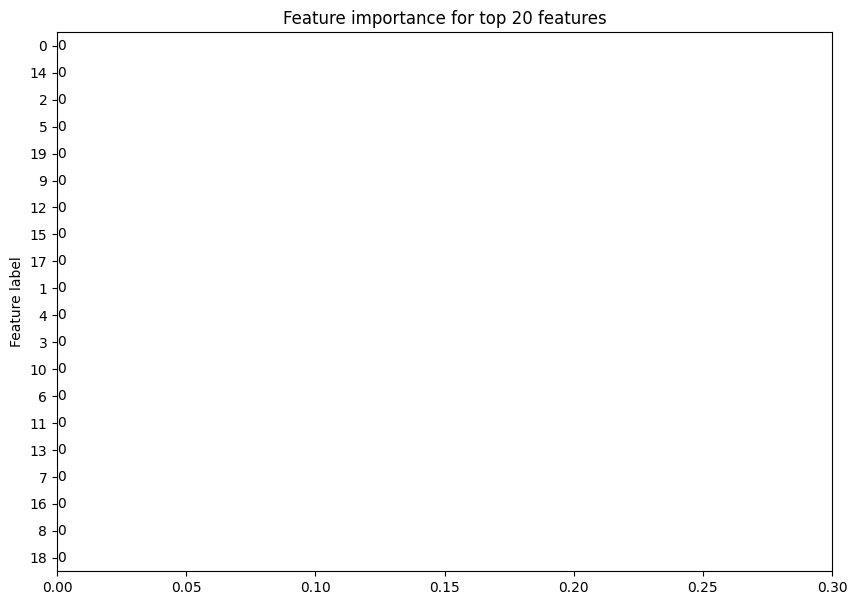

Explanation for graph hbmAIII_Mod.2.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


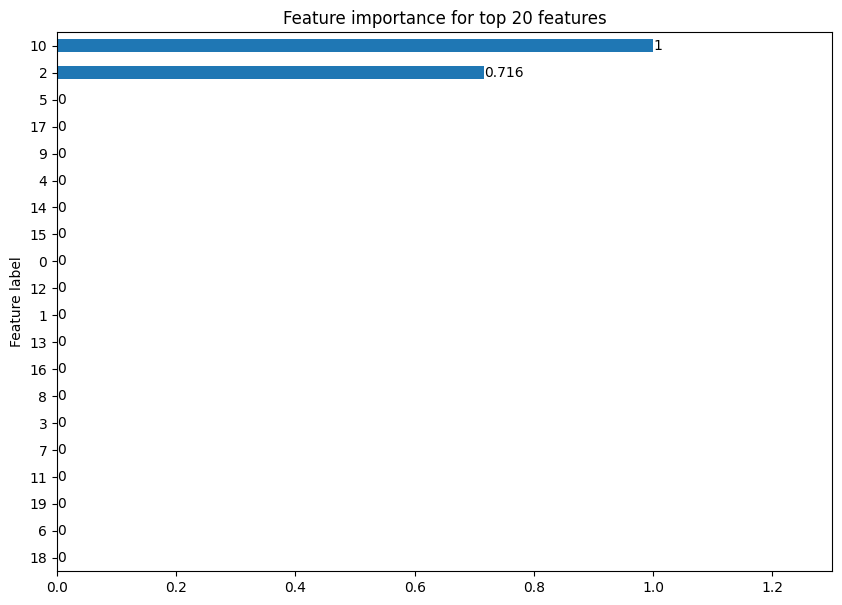

Explanation for graph herB_Mod.3.pdb_aligned: tensor([0.0000e+00, 0.0000e+00, 4.5834e-11,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.1204e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


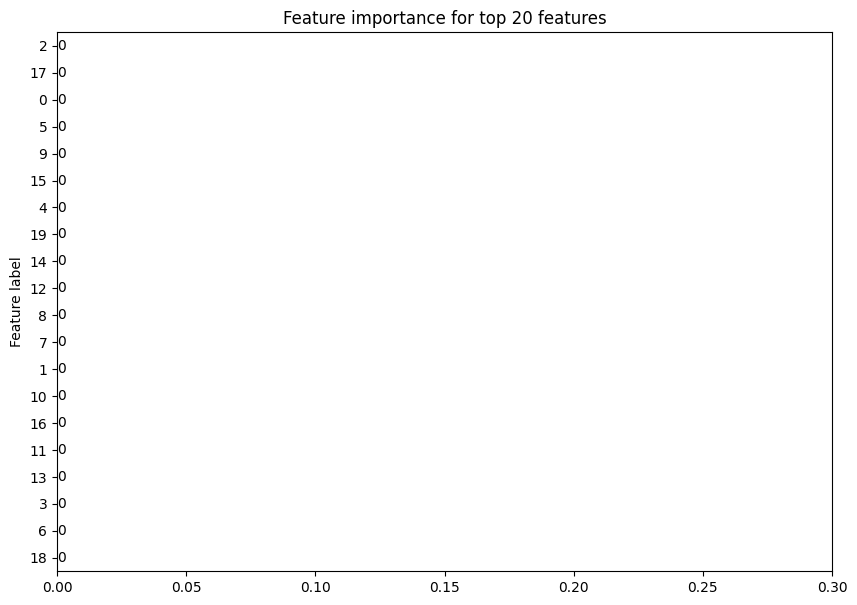

Explanation for graph nanA4_Mod.1.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4283e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


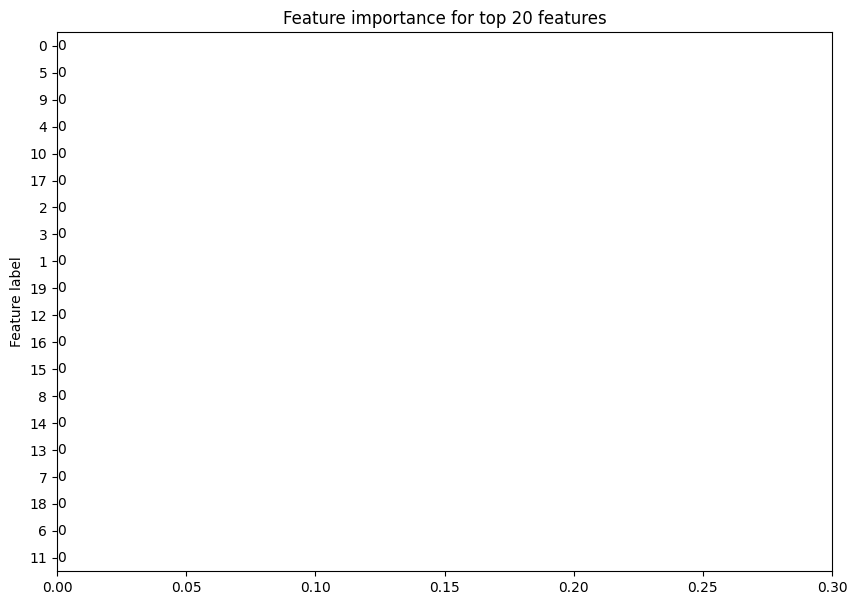

Explanation for graph hlsB_Mod.4.pdb_aligned: tensor([0., 0., 0.,  ..., 0., 0., 0.]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [3.4321e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.4569e-10, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


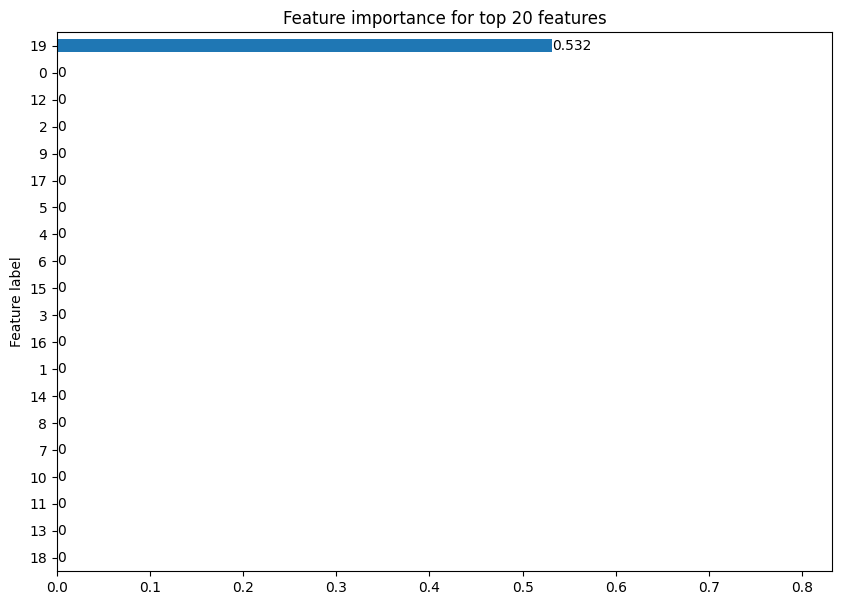

Explanation for graph ken12_Mod.2.pdb_aligned: tensor([4.5267e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


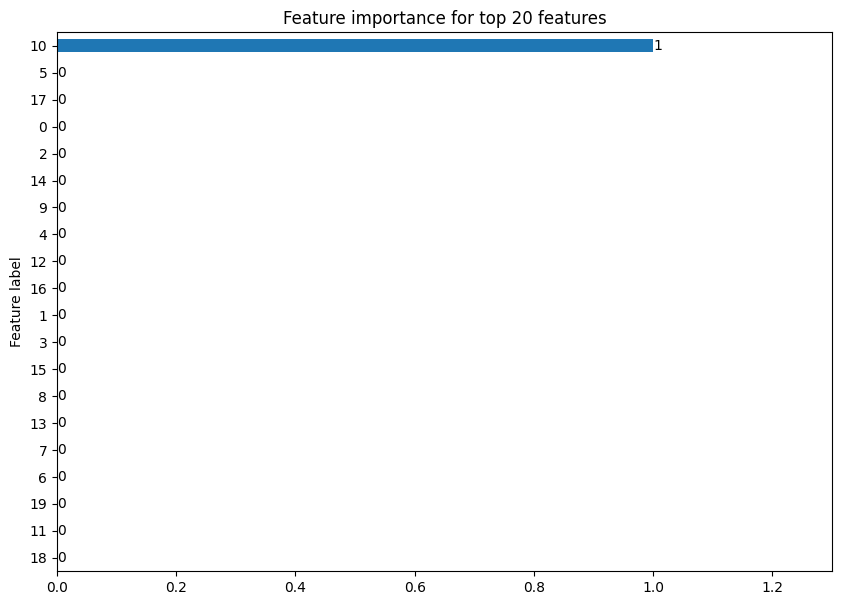

Explanation for graph AbsB2_Mod.2.pdb_aligned: tensor([4.7668e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.8911e-10, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 3.8544e-10, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


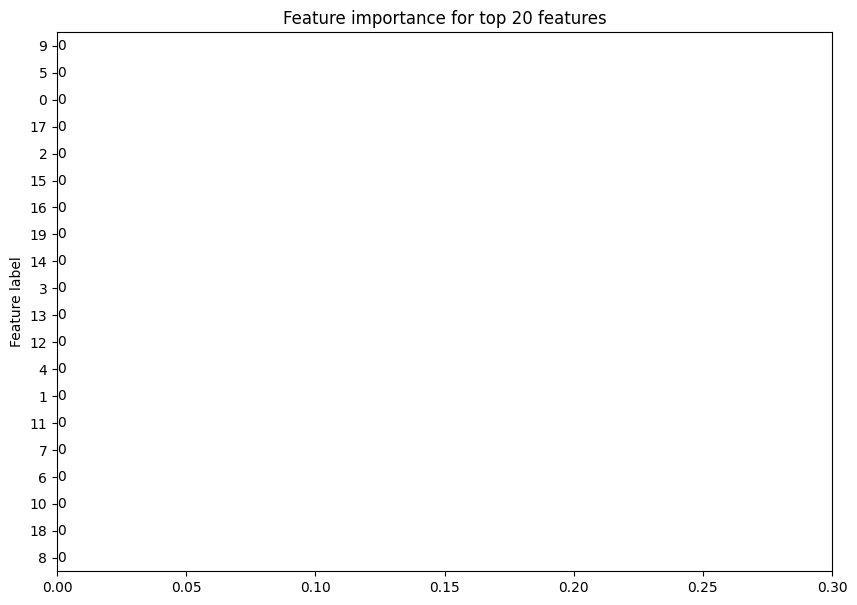

Explanation for graph ncdD_Mod.10.pdb_aligned: tensor([5.5784e-11, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
        0.0000e+00]) tensor([[0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [4.6205e-10, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        ...,
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00],
        [0.0000e+00, 0.0000e+00, 0.0000e+00,  ..., 0.0000e+00, 0.0000e+00,
         0.0000e+00]])


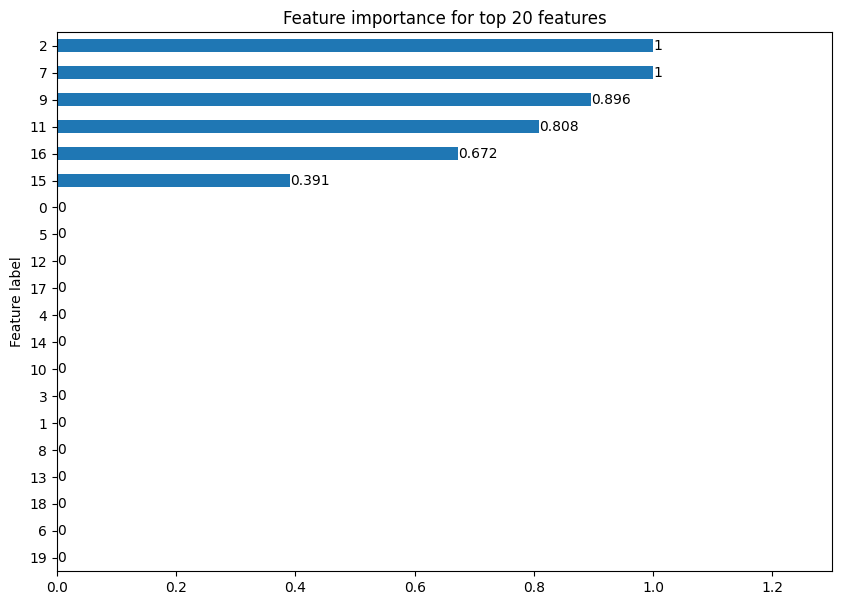

In [14]:
#### Block 5 #### 
### Explainer loop ### 
from torch_geometric.data import Data
from torch_geometric.explain import Explainer, GNNExplainer
import torch

import numpy as np
import os
import re
from sklearn.model_selection import train_test_split
import pandas as pd

# Specify the folder where you want to save the output files
output_folder = "/home/q31032mw/Dropbox (The University of Manchester)/Max/17_ML_Project/Rank_1/20240913_binaryclass_KS_dimers_DHvsER/"

# Create the folder if it doesn't exist
if not os.path.exists(output_folder):
    os.makedirs(output_folder)

# Iterate through your loader
explainer = Explainer(
    model=model,
    algorithm=GNNExplainer(epochs=100000),
    explanation_type='phenomenon', # options are model (describes the model) or phenomenon (describes why descision was made for input and input label)
    node_mask_type='attributes',
    edge_mask_type='object',
    model_config=dict(
        mode='binary_classification',
        task_level='graph',
        return_type='raw', 
    ),
)
# Iterate through your loader
loader = val_loader
for batch in loader:
    # Print some information about the current batch
    print(f"Processing batch with {batch.num_graphs} graphs")

    # Generate explanation for each graph in the batch
    for i in range(batch.num_graphs):
        # Extract data for the i-th graph in the batch
        graph_data = batch[i]

        # Create a new Data object
        data = Data(
            edge_index=graph_data.edge_index,
            node_id=graph_data.node_id,
            coords=graph_data.coords,
            name=graph_data.name,
            num_nodes=graph_data.num_nodes,
            x=graph_data.x.view(len(graph_data.node_id), 20),
        )

        # Extract the graph-level label for the current graph
        target_values = graph_data.graph_y.tolist()
        target = torch.tensor(target_values).float()

        # Generate explanation for the node at index `10`:
        explanation = explainer(x=data.x, edge_index=data.edge_index, batch=data.batch, target=target)

        # Print or do something with the explanation for the current graph
        print(f"Explanation for graph {graph_data.name}:", explanation.edge_mask, explanation.node_mask)

        # Optionally, you can visualize the feature importance for each graph
        explanation.visualize_feature_importance(top_k=20)

        # Save the output of visualize_graph to a file in the specified folder
        graphviz_output = explanation.visualize_graph(path=os.path.join(output_folder, f"graph_output_{graph_data.name}.pdf"), backend="graphviz")
        

